In [100]:
import scanpy as sc
import numpy as np
import pandas as pd
import scipy
import os, sys, glob, re
import pickle as pkl
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter, defaultdict
import scanpy.external as sce
from matplotlib import rcParams
import matplotlib
import bbknn

In [106]:
workDir="/home/dcha/02.glioblastoma_scRNAseq/scripts/bbknn/"
adata = sc.read(workDir+"rawHighVarCounts.csv", cache=False) 

metaInfo = pd.read_csv(workDir+"metaDf.csv", index_col=0)
adata.obs = adata.obs.join(metaInfo)
adata.raw=adata

In [99]:
mean_arr.shape

(2000,)

In [39]:
tot_cnt_cut=0
cnt_cut=0
group_key="cellType"
ctlist = np.array(sorted(list(set(adata.obs[group_key]))))
mtx = adata.raw
len_gene = mtx.X.shape[1]

mean_dt = {}
cnt_dt = {}
drop_dt = {}

#for ct in ctlist:
ct="CC2"
ct_cond = np.array(adata.obs[group_key]==ct)
#if np.sum(ct_cond)<tot_cnt_cut:
#    continue
#print(ct)
len_ct = np.sum(ct_cond)
mtx_ct = mtx.X[ct_cond]
pos_count = Counter(mtx_ct.nonzero()[1])
cnt_arr = np.zeros(len_gene)
for pos in pos_count:
    cnt_arr[pos] = pos_count[pos]
cnt_dt[ct] = cnt_arr
cnt_mask = (cnt_arr<cnt_cut)
drop_dt[ct] = cnt_arr/len_ct
mean_arr = np.matrix(np.mean(mtx_ct,axis=0)).A1
mean_arr[cnt_mask] = 0
mean_dt[ct] = mean_arr

## Seurat Variable gene Count, PC to Scanpy adata

In [107]:
workDir="/home/dcha/02.glioblastoma_scRNAseq/scripts/bbknn/"
adata0 = sc.read(workDir+"rawHighVarCounts.csv", cache=False) ### adata0.X => raw count matrix (cell x gene) adata0.obs => cell x metaColumns, adata0.var => genes

metaInfo = pd.read_csv(workDir+"metaDf.csv", index_col=0)
adata0.obs = adata0.obs.join(metaInfo)
adata0.raw=adata0

sc.pp.normalize_total(adata0, target_sum=1e4)
sc.pp.log1p(adata0)
sc.pp.scale(adata0, max_value=10)

pcEmb_raw=pd.read_csv(workDir+"seuratPcaEmb.csv", index_col=0)
pcTransition_raw=pd.read_csv(workDir+"seuratPcaTransition.csv", index_col=0)
pcVar_raw=pd.read_csv(workDir+"seuratPcaVar.csv", index_col=0)

## First BBKNN run

In [76]:
nDim=15

pcEmb=pcEmb_raw.iloc[:,0:nDim]
pcTransition=pcTransition_raw.iloc[:,0:nDim]
pcVar=pcVar_raw.iloc[0:nDim,:]

adata0_bbknn_first = adata0.copy()
sc.pp.pca(adata0_bbknn_first, n_comps=nDim)

adata0_bbknn_first.uns['pca']['params']['use_highly_variable']=True
adata0_bbknn_first.uns['pca']['variance']=pcVar["variance"].to_numpy(dtype="float32")
adata0_bbknn_first.uns['pca']['variance_ratio']=pcVar["variance_ratio"].to_numpy(dtype="float32")

adata0_bbknn_first.obsm["X_pca"]=pcEmb.to_numpy(dtype="float32")
adata0_bbknn_first.varm["PCs"]=pcTransition.to_numpy(dtype="float32")

bbknn.bbknn(adata0_bbknn_first, batch_key='batch')
sc.tl.umap(adata0_bbknn_first)
sc.tl.leiden(adata0_bbknn_first, key_added='cluster_bbknn', resolution=3.0)

In [45]:
adata0_bbknn_first

AnnData object with n_obs × n_vars = 33271 × 2000
    obs: 'batch', 'timePoint', 'cellType', 'cluster_bbknn'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

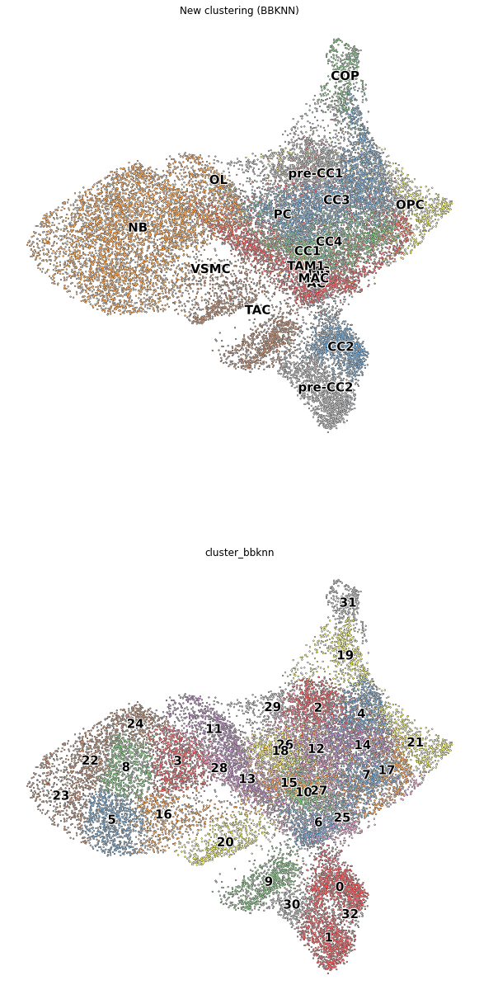

In [75]:
rcParams['figure.figsize'] = 10,10
sc.pl.umap(bbknn_coi_pc15, color=['cellType', 'cluster_bbknn'], add_outline=True, legend_loc='on data',
           legend_fontsize=15, legend_fontoutline=2, frameon=False, ncols=1,
           title=['New clustering (BBKNN)'], palette='Set1')

In [68]:
bbknn_coi_pc15=adata0_bbknn_first.copy()
#bbknn_coi_pc20=adata0_bbknn_first.copy()
#bbknn_coi_pc30=adata0_bbknn_first.copy()

... storing 'cellTypeSpecific' as categorical


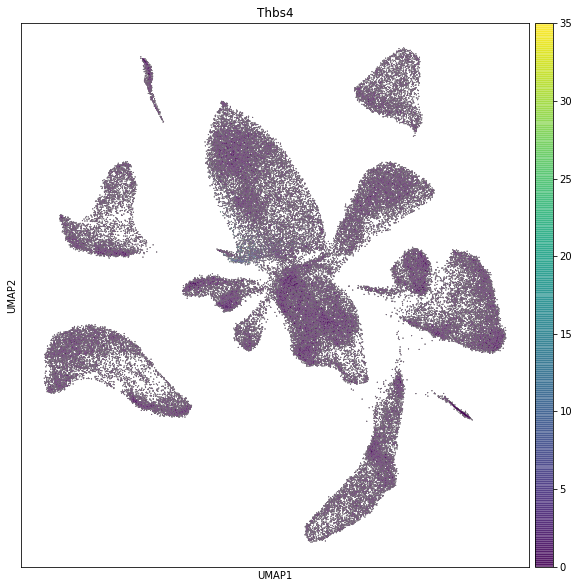

In [266]:
ct=["OPC", "pre-CC1", "CC1"]

adata0_bbknn_first_toPlot=adata0_bbknn_first.copy()
cellTypes=adata0_bbknn_first_toPlot.obs["cellType"].tolist()
cellTypeSpecific=[k if k in ct else "None" for k in cellTypes]
adata0_bbknn_first_toPlot.obs["cellTypeSpecific"]=cellTypeSpecific

rcParams['figure.figsize'] = 10,10
sc.pl.umap(adata0_bbknn_first_toPlot, color=['Thbs4'], add_outline=True)

In [77]:
nDim=20
bbknn_obj = bbknn_coi_pc20
umap2df=pd.DataFrame(bbknn_obj.obsm["X_umap"])
umap2df.columns=["UMAP_1", "UMAP_2"]
umap2df.index=bbknn_obj.obs.index.to_list()
umap2df.to_csv(workDir+"BBKNN_{0}_UMAP.txt".format(nDim), sep="\t")

cluster2df=pd.DataFrame(bbknn_obj.obs["cluster_bbknn"])
cluster2df.columns=["bbknn_leiden"]
cluster2df.index=bbknn_obj.obs.index.to_list()
cluster2df.to_csv(workDir+"BBKNN_{0}_leiden.txt".format(nDim), sep="\t")

scipy.sparse.save_npz(workDir+"BBKNN_{0}_connectivities.npz".format(nDim), bbknn_obj.obsp["connectivities"].tocsc())

## Second BBKNN Run

In [262]:
adata0_bbknn_second = adata0_bbknn_first.copy()
bbknn.ridge_regression(adata0_bbknn_second, batch_key=['batch'], confounder_key=['cluster_bbknn'])
sc.pp.pca(adata0_bbknn_second)
bbknn.bbknn(adata0_bbknn_second, batch_key='batch')
sc.tl.umap(adata0_bbknn_second)

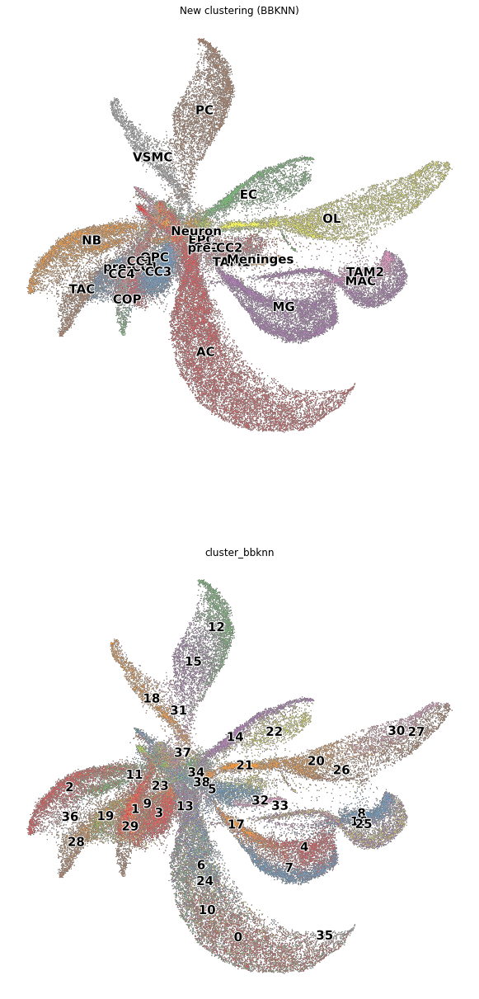

In [255]:
rcParams['figure.figsize'] = 10,10
sc.pl.umap(adata0_bbknn_second, color=['cellType', "cluster_bbknn"], add_outline=True, legend_loc='on data',
           legend_fontsize=15,
           legend_fontoutline=2, frameon=False, ncols=1,
           title=['New clustering (BBKNN)'], palette='Set1')

... storing 'cellTypeSpecific' as categorical


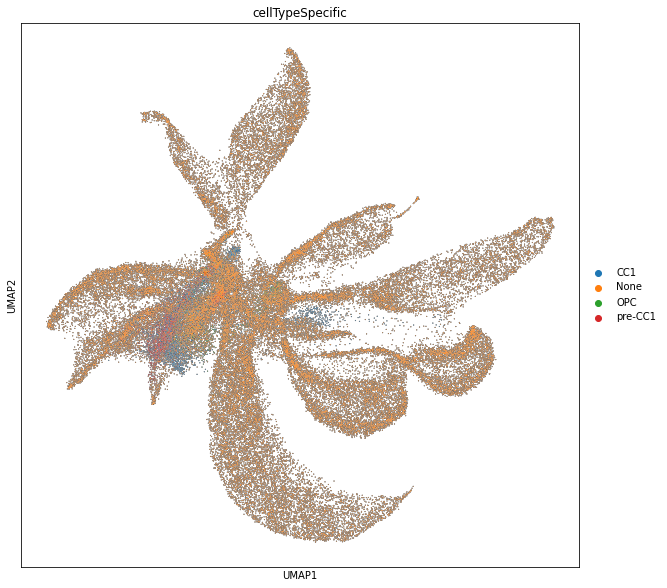

In [246]:
ct=["OPC", "pre-CC1", "CC1"]

adata0_bbknn_second_toPlot=adata0_bbknn_second.copy()
cellTypes=adata0_bbknn_second_toPlot.obs["cellType"].tolist()
cellTypeSpecific=[k if k in ct else "None" for k in cellTypes]
adata0_bbknn_second_toPlot.obs["cellTypeSpecific"]=cellTypeSpecific

rcParams['figure.figsize'] = 10,10
sc.pl.umap(adata0_bbknn_second_toPlot, color=['cellTypeSpecific'], add_outline=True)

## No Batch correction

In [43]:
sc.pp.pca(adata0_no, n_comps=50)

computing PCA
    with n_comps=50
    finished (0:00:09)


In [44]:
sc.pp.neighbors(adata0_no, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


In [45]:
sc.tl.umap(adata0_no)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:31)


In [46]:
sc.tl.leiden(adata0_no, key_added='cluster00', resolution=0.65)

running Leiden clustering
    finished: found 27 clusters and added
    'cluster00', the cluster labels (adata.obs, categorical) (0:00:06)


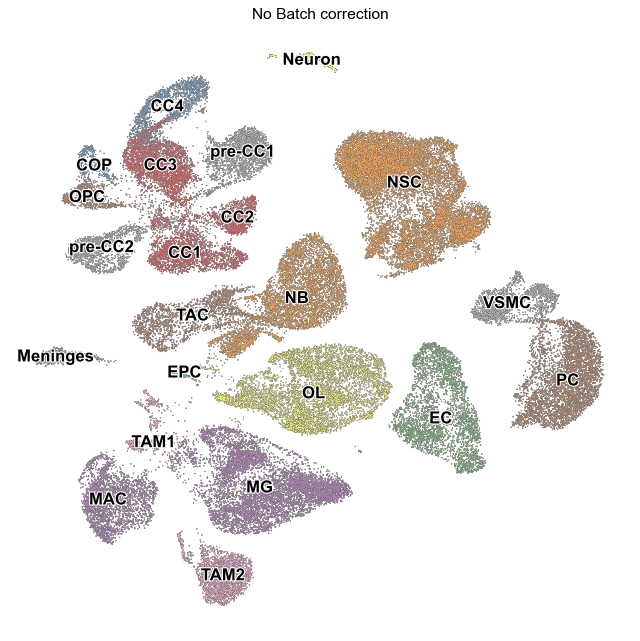

In [47]:
rcParams['figure.figsize'] = 10,10
sc.pl.umap(adata0_no, color=['cluster'], add_outline=True, legend_loc='on data',
           legend_fontsize=15, legend_fontoutline=2, frameon=False, ncols=1,
           title=['No Batch correction'], palette='Set1')

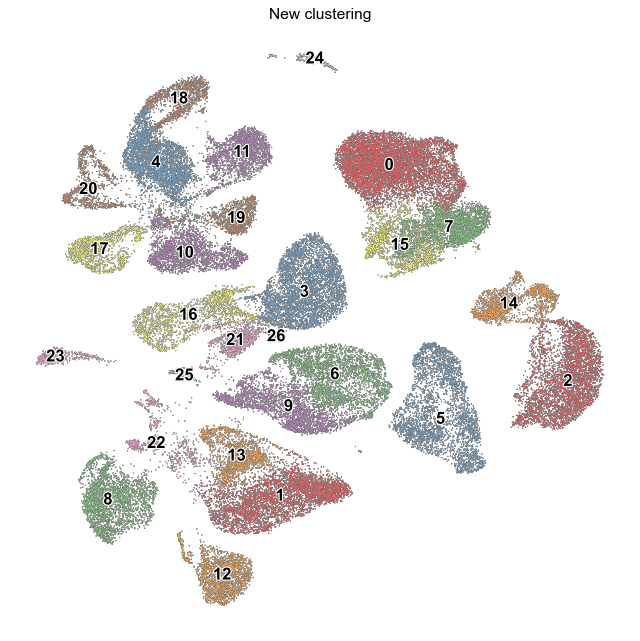

In [48]:
rcParams['figure.figsize'] = 10,10
sc.pl.umap(adata0_no, color=['cluster00'], add_outline=True, legend_loc='on data',
           legend_fontsize=15, legend_fontoutline=2, frameon=False, ncols=1,
           title=['New clustering'], palette='Set1')

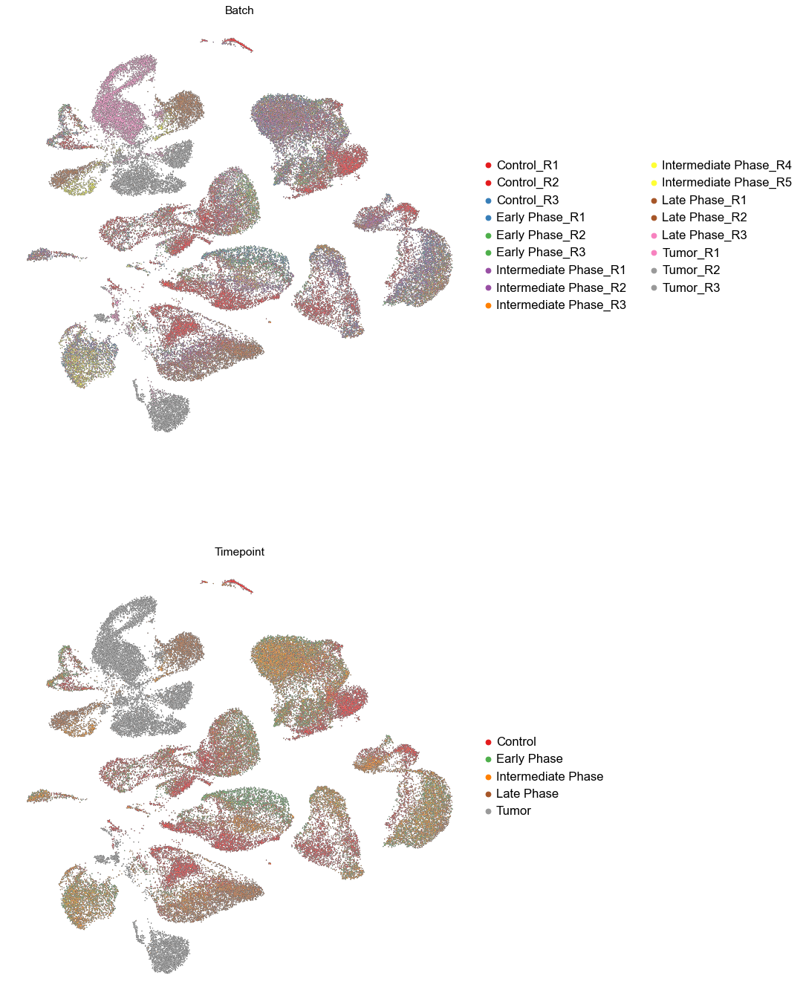

In [49]:
rcParams['figure.figsize'] = 10,10
sc.pl.umap(adata0_no, color=['batch','Timepoint'], add_outline=True, legend_loc='right margin',
           legend_fontsize=15, legend_fontoutline=2, frameon=False, ncols=1,
           title=['Batch', 'Timepoint'], palette='Set1')

### Batch 별로 확인

In [50]:
adata0_C1 = adata0[adata0.obs['batch'].isin(['Control_R1'])]
adata0_C2 = adata0[adata0.obs['batch'].isin(['Control_R2'])]
adata0_C3 = adata0[adata0.obs['batch'].isin(['Control_R3'])]

adata0_E1 = adata0[adata0.obs['batch'].isin(['Early Phase_R1'])]
adata0_E2 = adata0[adata0.obs['batch'].isin(['Early Phase_R2'])]
adata0_E3 = adata0[adata0.obs['batch'].isin(['Early Phase_R3'])]

adata0_I1 = adata0[adata0.obs['batch'].isin(['Intermediate Phase_R1'])]
adata0_I2 = adata0[adata0.obs['batch'].isin(['Intermediate Phase_R2'])]
adata0_I3 = adata0[adata0.obs['batch'].isin(['Intermediate Phase_R3'])]
adata0_I4 = adata0[adata0.obs['batch'].isin(['Intermediate Phase_R4'])]
adata0_I5 = adata0[adata0.obs['batch'].isin(['Intermediate Phase_R5'])]

adata0_L1 = adata0[adata0.obs['batch'].isin(['Late Phase_R1'])]
adata0_L2 = adata0[adata0.obs['batch'].isin(['Late Phase_R2'])]
adata0_L3 = adata0[adata0.obs['batch'].isin(['Late Phase_R3'])]

adata0_T1 = adata0[adata0.obs['batch'].isin(['Tumor_R1'])]
adata0_T2 = adata0[adata0.obs['batch'].isin(['Tumor_R2'])]
adata0_T3 = adata0[adata0.obs['batch'].isin(['Tumor_R3'])]

In [51]:
batches = [adata0_C1,adata0_C2,adata0_C3,adata0_E1,adata0_E2,adata0_E3,adata0_I1,adata0_I2,adata0_I3,adata0_I4,adata0_I5,adata0_L1,adata0_L2,adata0_L3,adata0_T1,adata0_T2,adata0_T3]

In [52]:
for batch in batches:
    sc.pl.umap(batch, color=['cluster','B2m'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, ncols=3, frameon=False)

KeyError: "Could not find entry in `obsm` for 'umap'.\nAvailable keys are: []."

In [ ]:
sc.pl.violin(adata0, ['B2m'], groupby='batch', rotation=45)
sc.pl.violin(adata0, ['H2-K1'], groupby='batch', rotation=45)
sc.pl.violin(adata0, ['H2-D1'], groupby='batch', rotation=45)

## Cancer cell 분리

In [53]:
conditionp = adata0.obs['cluster'].isin(['OPC','COP','CC1','CC2','CC3','CC4','pre-CC1','pre-CC2'])
adatap = sc.AnnData(adata0[conditionp].raw.X)
adatap.var = adata0.raw.var
adatap.obs = adata0.obs[conditionp]
adatap.raw = adatap.copy()

In [182]:
conditionq = adata0.obs['cluster'].isin(['CC2','pre-CC2'])
adataq = sc.AnnData(adata0[conditionq].raw.X)
adataq.var = adata0.raw.var
adataq.obs = adata0.obs[conditionq]
adataq.raw = adataq.copy()

In [183]:
results_file_p = 'write/KW_GBM(p).h5ad' 
results_file_q = 'write/KW_GBM(q).h5ad' 

In [185]:
adatap.write(results_file_p)

In [186]:
adataq.write(results_file_q)

In [54]:
sc.pp.filter_genes_dispersion(adatap)

extracting highly variable genes
    finished (0:00:00)


In [55]:
sc.pp.scale(adatap, max_value=10)

In [70]:
adatap_harmony = adatap.copy()
adatap_bbknn = adatap.copy()
adatap_no = adatap.copy()

### Harmony

In [57]:
sc.pp.pca(adatap_harmony, n_comps=20)

computing PCA
    with n_comps=20
    finished (0:00:01)


In [58]:
sce.pp.harmony_integrate(adatap_harmony,'batch',adjusted_basis='X_pca',max_iter_harmony=50)

2021-06-29 09:23:23,262 - harmonypy - INFO - Iteration 1 of 50
2021-06-29 09:23:25,117 - harmonypy - INFO - Iteration 2 of 50
2021-06-29 09:23:26,944 - harmonypy - INFO - Iteration 3 of 50
2021-06-29 09:23:28,765 - harmonypy - INFO - Iteration 4 of 50
2021-06-29 09:23:30,755 - harmonypy - INFO - Iteration 5 of 50
2021-06-29 09:23:32,731 - harmonypy - INFO - Iteration 6 of 50
2021-06-29 09:23:34,700 - harmonypy - INFO - Iteration 7 of 50
2021-06-29 09:23:37,052 - harmonypy - INFO - Iteration 8 of 50
2021-06-29 09:23:39,704 - harmonypy - INFO - Iteration 9 of 50
2021-06-29 09:23:41,826 - harmonypy - INFO - Iteration 10 of 50
2021-06-29 09:23:43,206 - harmonypy - INFO - Iteration 11 of 50
2021-06-29 09:23:45,295 - harmonypy - INFO - Iteration 12 of 50
2021-06-29 09:23:47,473 - harmonypy - INFO - Iteration 13 of 50
2021-06-29 09:23:49,582 - harmonypy - INFO - Iteration 14 of 50
2021-06-29 09:23:50,883 - harmonypy - INFO - Iteration 15 of 50
2021-06-29 09:23:53,154 - harmonypy - INFO - Iter

In [59]:
sc.pp.neighbors(adatap_harmony, n_pcs=20)

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [60]:
sc.tl.umap(adatap_harmony)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


In [61]:
sc.tl.leiden(adatap_harmony, key_added='cluster_cc_harmony', resolution=0.65)

running Leiden clustering
    finished: found 17 clusters and added
    'cluster_cc_harmony', the cluster labels (adata.obs, categorical) (0:00:01)


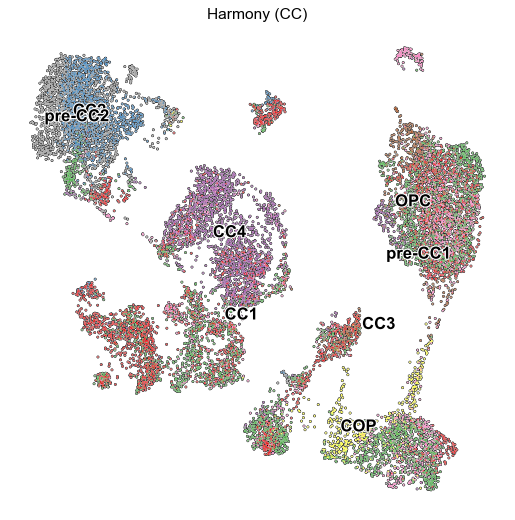

In [62]:
rcParams['figure.figsize'] = 8,8
sc.pl.umap(adatap_harmony, color=['cluster'], add_outline=True, legend_loc='on data',
           legend_fontsize=15, legend_fontoutline=2, title = ['Harmony (CC)'], frameon=False, ncols=1, palette='Set1')

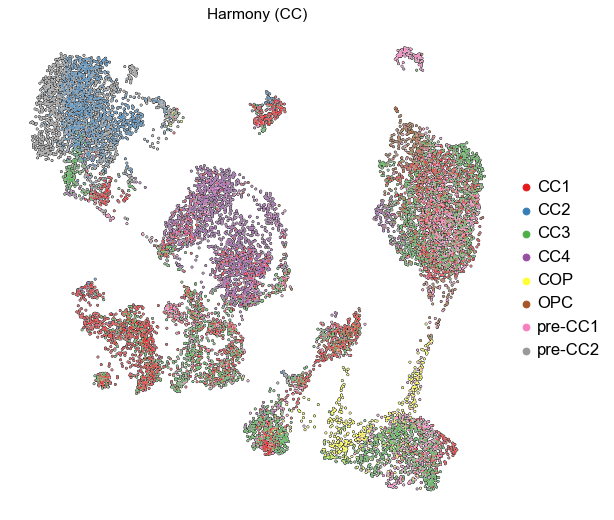

In [63]:
rcParams['figure.figsize'] = 8,8
sc.pl.umap(adatap_harmony, color=['cluster'], add_outline=True, legend_loc='right margin',
           legend_fontsize=15, legend_fontoutline=2, title = ['Harmony (CC)'], frameon=False, ncols=1, palette='Set1')

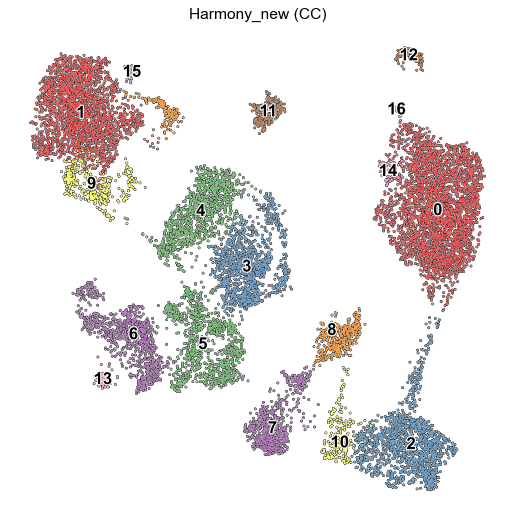

In [64]:
rcParams['figure.figsize'] = 8,8
sc.pl.umap(adatap_harmony, color=['cluster_cc_harmony'], add_outline=True, legend_loc='on data',
           legend_fontsize=15, legend_fontoutline=2, title = ['Harmony_new (CC)'], frameon=False, ncols=1, palette='Set1')

### BBKNN

In [84]:
adatap_bbknn = adatap.copy()

In [85]:
sc.pp.pca(adatap_bbknn, n_comps=20)

computing PCA
    with n_comps=20
    finished (0:00:00)


In [156]:
adatap_bbknn.obs['batch'].isin(['Control_R1']).tolist().count(True)

71

In [157]:
adatap_bbknn.obs['batch'].isin(['Control_R2']).tolist().count(True)

370

In [158]:
adatap_bbknn.obs['batch'].isin(['Control_R3']).tolist().count(True)

12

In [159]:
adatap_bbknn.obs['batch'].isin(['Early Phase_R1']).tolist().count(True)

150

In [160]:
adatap_bbknn.obs['batch'].isin(['Early Phase_R2']).tolist().count(True)

13

In [161]:
adatap_bbknn.obs['batch'].isin(['Early Phase_R3']).tolist().count(True)

174

In [162]:
adatap_bbknn.obs['batch'].isin(['Intermediate Phase_R1']).tolist().count(True)

51

In [163]:
adatap_bbknn.obs['batch'].isin(['Intermediate Phase_R2']).tolist().count(True)

35

In [164]:
adatap_bbknn.obs['batch'].isin(['Intermediate Phase_R3']).tolist().count(True)

2

In [165]:
adatap_bbknn.obs['batch'].isin(['Intermediate Phase_R4']).tolist().count(True)

104

In [166]:
adatap_bbknn.obs['batch'].isin(['Intermediate Phase_R5']).tolist().count(True)

607

In [167]:
adatap_bbknn.obs['batch'].isin(['Late Phase_R1']).tolist().count(True)

20

In [168]:
adatap_bbknn.obs['batch'].isin(['Late Phase_R2']).tolist().count(True)

2583

In [169]:
adatap_bbknn.obs['batch'].isin(['Late Phase_R3']).tolist().count(True)

76

In [170]:
adatap_bbknn.obs['batch'].isin(['Tumor_R1']).tolist().count(True)

5032

In [171]:
adatap_bbknn.obs['batch'].isin(['Tumor_R2']).tolist().count(True)

3704

In [172]:
adatap_bbknn.obs['batch'].isin(['Tumor_R3']).tolist().count(True)

163

In [83]:
bbknn.bbknn(adatap_bbknn, batch_key='batch')

computing batch balanced neighbors


ValueError: Not all batches have at least `neighbors_within_batch` cells in them.

In [ ]:
sc.tl.umap(adatap_bbknn)

In [ ]:
sc.tl.leiden(adatap_bbknn, key_added='cluster_cc_bbknn', resolution=0.65)

In [ ]:
rcParams['figure.figsize'] = 8,8
sc.pl.umap(adatap_bbknn, color=['cluster'], add_outline=True, legend_loc='on data',
           legend_fontsize=15, legend_fontoutline=2, title = ['BBKNN (CC)'], frameon=False, ncols=1, palette='Set1')

In [ ]:
rcParams['figure.figsize'] = 8,8
sc.pl.umap(adatap_bbknn, color=['cluster'], add_outline=True, legend_loc='right margin',
           legend_fontsize=15, legend_fontoutline=2, title = ['BBKNN (CC)'], frameon=False, ncols=1, palette='Set1')

In [ ]:
rcParams['figure.figsize'] = 8,8
sc.pl.umap(adatap_bbknn, color=['cluster_cc_harmony'], add_outline=True, legend_loc='on data',
           legend_fontsize=15, legend_fontoutline=2, title = ['BBKNN_new (CC)'], frameon=False, ncols=1, palette='Set1')

### No Batch correction

In [88]:
sc.pp.pca(adatap_no, n_comps=20)

computing PCA
    with n_comps=20
    finished (0:00:00)


In [89]:
sc.pp.neighbors(adatap_no, n_pcs=20)

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [90]:
sc.tl.umap(adatap_no)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


In [91]:
sc.tl.leiden(adatap_no, key_added='cluster_cc_no', resolution=0.65)

running Leiden clustering
    finished: found 16 clusters and added
    'cluster_cc_no', the cluster labels (adata.obs, categorical) (0:00:02)


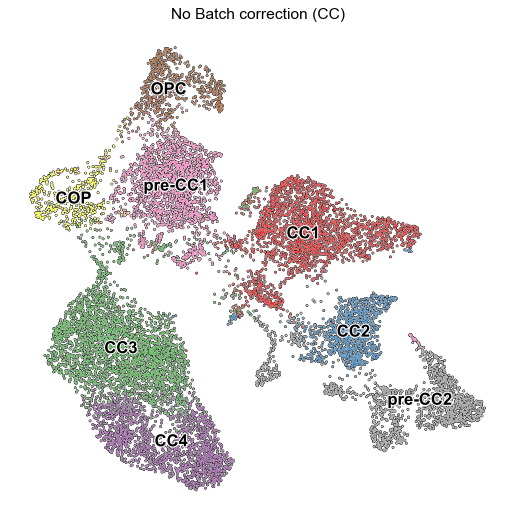

In [95]:
rcParams['figure.figsize'] = 8,8
sc.pl.umap(adatap_no, color=['cluster'], add_outline=True, legend_loc='on data',
           legend_fontsize=15, legend_fontoutline=2, title = ['No Batch correction (CC)'], frameon=False, ncols=1, palette='Set1')

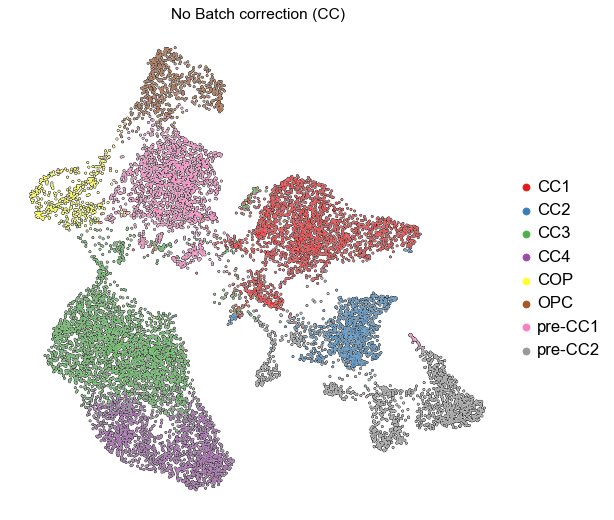

In [96]:
rcParams['figure.figsize'] = 8,8
sc.pl.umap(adatap_no, color=['cluster'], add_outline=True, legend_loc='right margin',
           legend_fontsize=15, legend_fontoutline=2, title = ['No Batch correction (CC)'], frameon=False, ncols=1, palette='Set1')

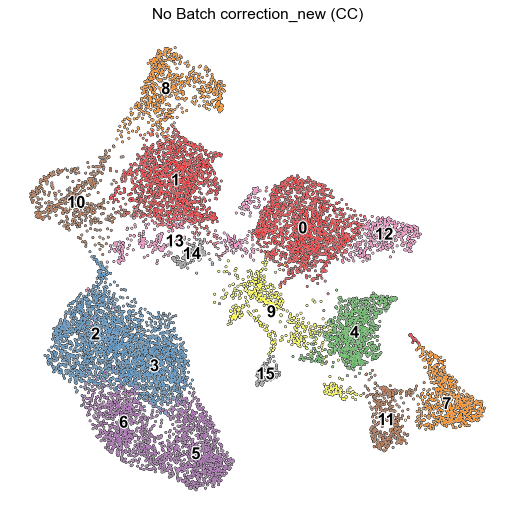

In [97]:
rcParams['figure.figsize'] = 8,8
sc.pl.umap(adatap_no, color=['cluster_cc_no'], add_outline=True, legend_loc='on data',
           legend_fontsize=15, legend_fontoutline=2, title = ['No Batch correction_new (CC)'], frameon=False, ncols=1, palette='Set1')

## MHC 관련 분석

In [67]:
MHC = ['Psmb10', 'Psmb8', 'Psmb9', 'Psme1', 'Psme2', 'Tap1', 'Tap2', 'Erap1', 'Tapbp', 'Tapbpl', 'Hspa5', 'Calr', 'Calr3', 'Canx', 'Pdia3']
rcParams['figure.figsize'] = 5,5
adata00.uns['Timepoint_colors'] = ['#93f38f', '#f8fa85', '#fad185', '#fa9a85', '#f31010']

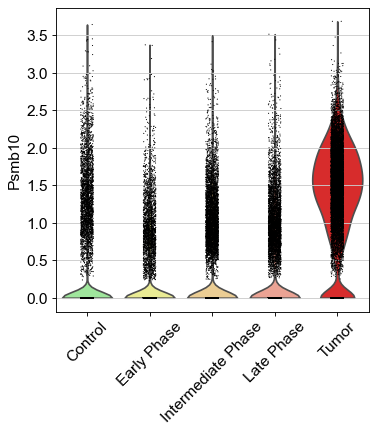

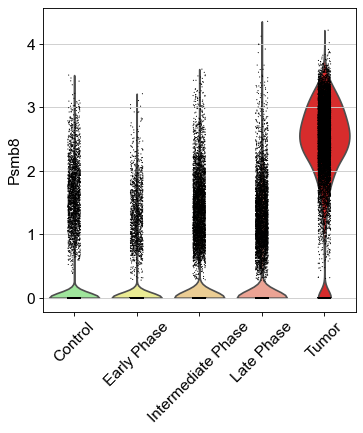

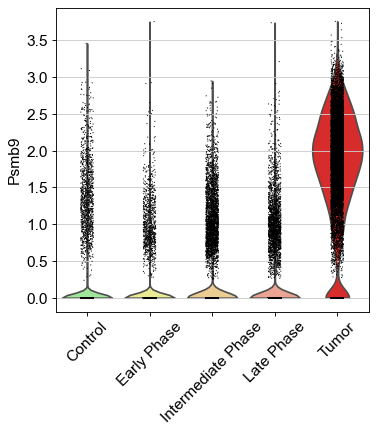

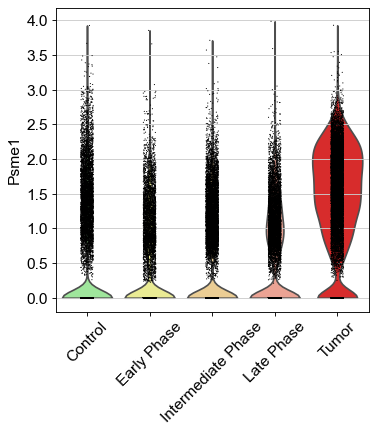

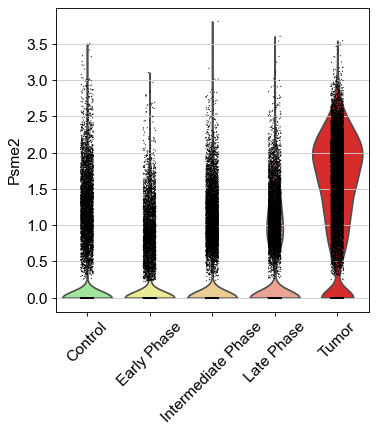

...

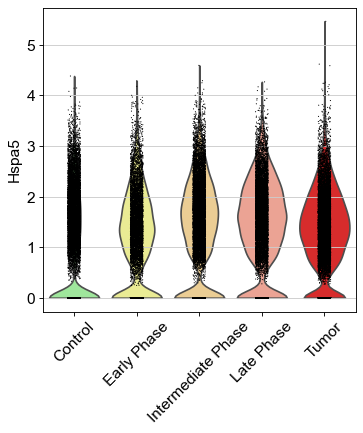

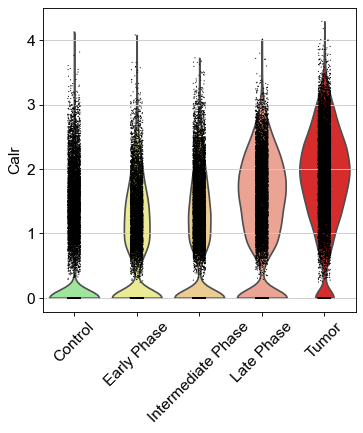

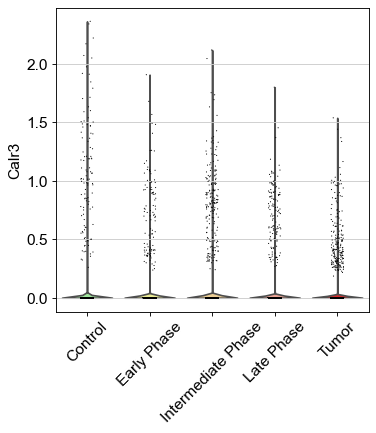

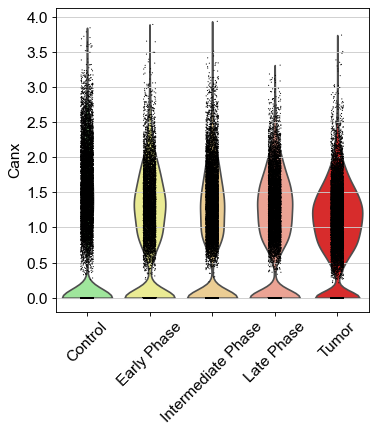

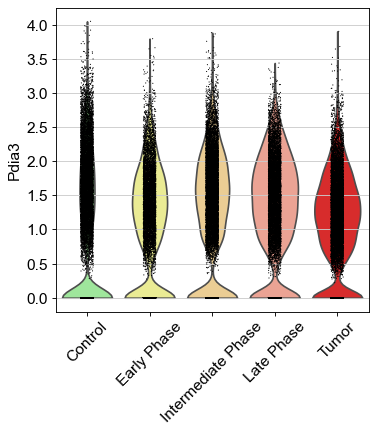

In [68]:
for gene in MHC:
    sc.pl.violin(adata00, gene, groupby='Timepoint', rotation=45)

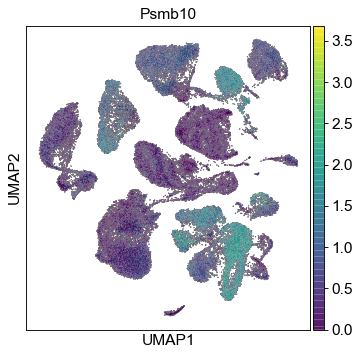

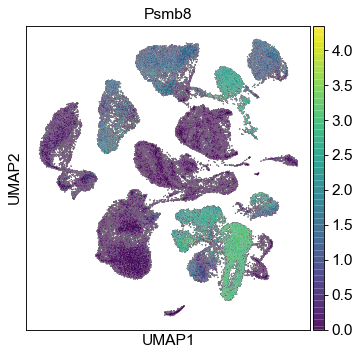

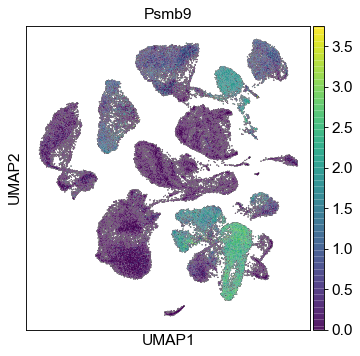

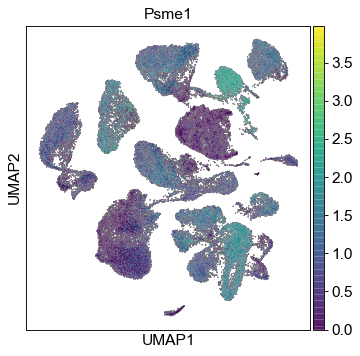

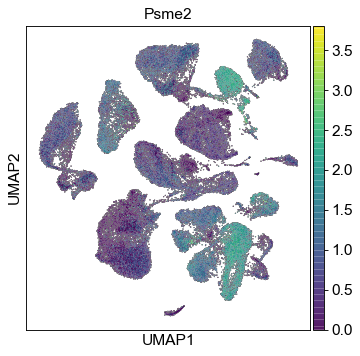

...

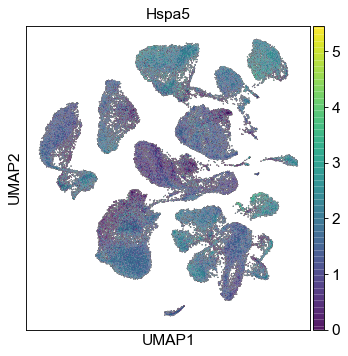

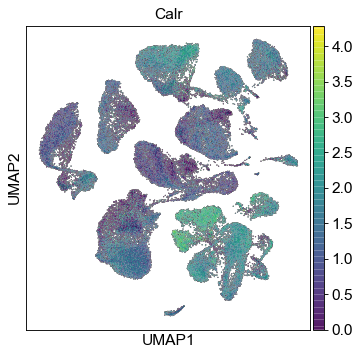

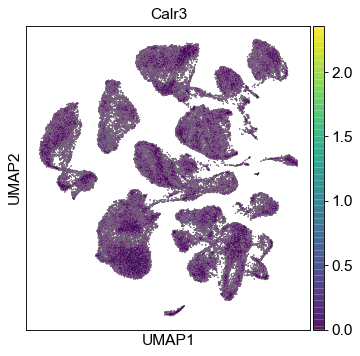

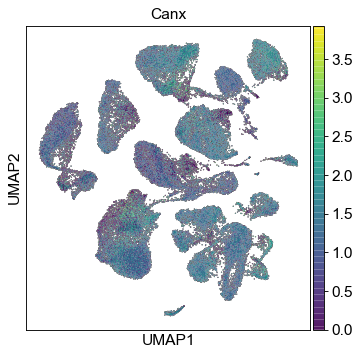

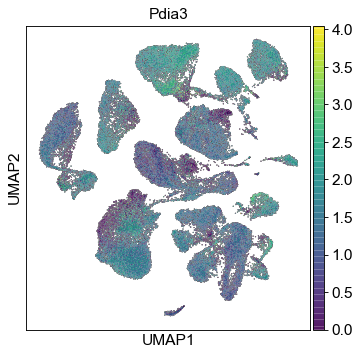

In [69]:
for gene in MHC:
    sc.pl.umap(adata00, color=[gene], add_outline=True)

In [48]:
MHC1 = ['H2-K1','H2-DMa','H2-DMb2','H2-DMb1','H2-D1', 'B2m']
MHC1b = ['H2-Q4', 'H2-Q6', 'H2-Q7', 'H2-M2', 'H2-T22', 'H2-T23']
MHC2 = ['H2-Aa', 'H2-Ab1', 'H2-Eb1', 'H2-Oa', 'Cd74']
rcParams['figure.figsize'] = 5,5

In [49]:
for gene in MHC1:
    sc.pl.violin(adata0, gene, groupby='Timepoint', rotation=45)

KeyError: "Could not find keys '['Ifna1']' in columns of `adata.obs` or in adata.raw.var_names."

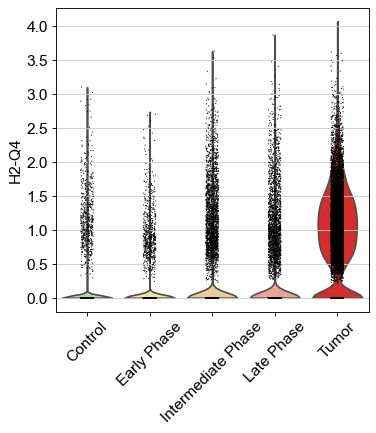

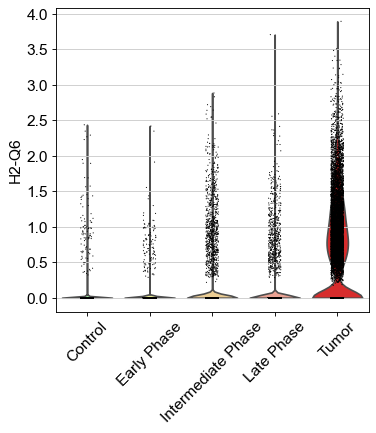

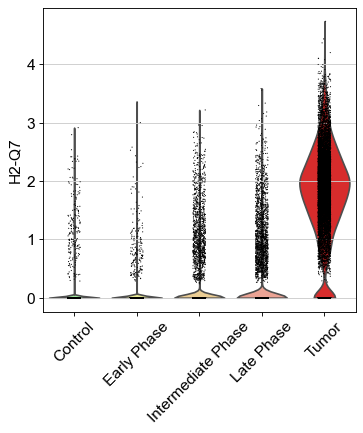

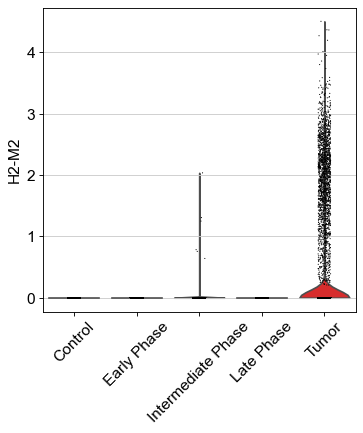

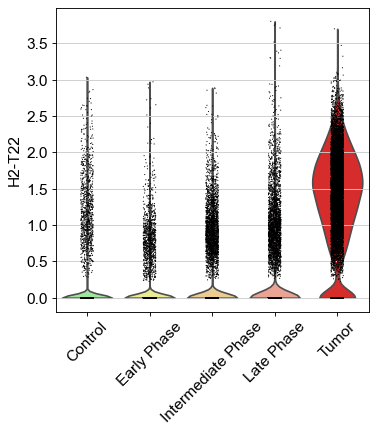

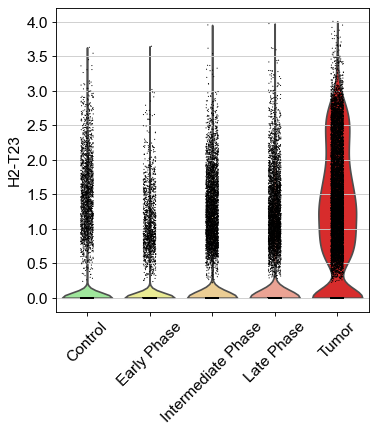

In [40]:
for gene in MHC1b:
    sc.pl.violin(adata0, gene, groupby='Timepoint', rotation=45)

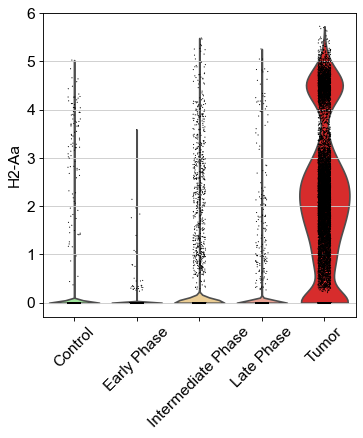

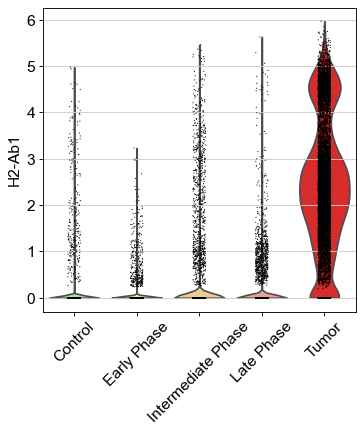

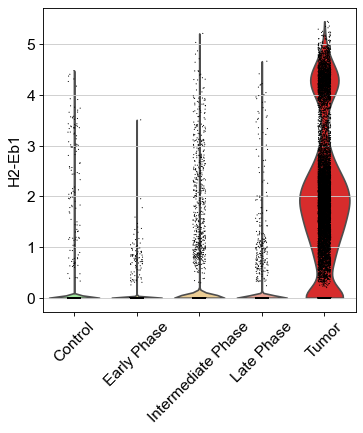

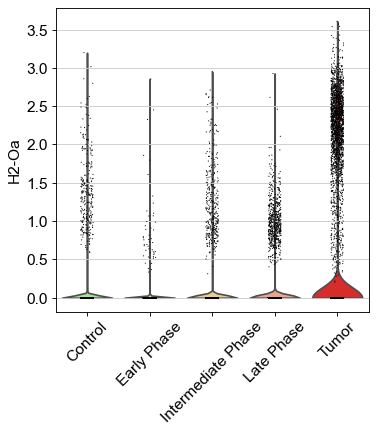

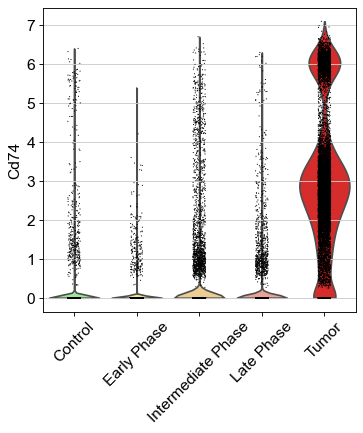

In [41]:
for gene in MHC2:
    sc.pl.violin(adata0, gene, groupby='Timepoint', rotation=45)

### Immune cell subclustering

In [ ]:
results_file1 = 'write/KW_GBM(1).h5ad' 

In [20]:
condition1 = adata0.obs['cluster'].isin(['MG','MAC','TAM1','TAM2'])

In [30]:
adata1 = sc.AnnData(adata0[condition1].raw.X)
adata1.var = adata0.raw.var
adata1.obs = adata0.obs[condition1]
adata1.raw = adata1.copy()

In [31]:
sc.pp.filter_genes_dispersion(adata1)

extracting highly variable genes
    finished (0:00:00)


In [32]:
sc.pp.scale(adata1,max_value=10)

In [33]:
sc.pp.pca(adata1,n_comps =50)

computing PCA
    with n_comps=50
    finished (0:00:04)


In [34]:
sce.pp.harmony_integrate(adata1,'batch',adjusted_basis='X_pca')

2021-04-26 10:57:17,197 - harmonypy - INFO - Iteration 1 of 10
2021-04-26 10:57:19,016 - harmonypy - INFO - Iteration 2 of 10
2021-04-26 10:57:20,851 - harmonypy - INFO - Iteration 3 of 10
2021-04-26 10:57:22,519 - harmonypy - INFO - Converged after 3 iterations


In [35]:
sc.pp.neighbors(adata1,n_pcs=45)

computing neighbors
    using 'X_pca' with n_pcs = 45
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [36]:
sc.tl.umap(adata1)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


In [37]:
sc.tl.leiden(adata1, key_added='cluster1', resolution = 0.6)

running Leiden clustering
    finished: found 11 clusters and added
    'cluster1', the cluster labels (adata.obs, categorical) (0:00:01)


In [38]:
C1 = annotater(adata1, 'celltype1')
C1.update(adata1, 'cluster1', '0', 'MG1')
C1.update(adata1, 'cluster1', '1', 'MAC')
C1.update(adata1, 'cluster1', '2', 'MG2')
C1.update(adata1, 'cluster1', '3', 'TAM2')
C1.update(adata1, 'cluster1', '4', 'Intermediate')
C1.update(adata1, 'cluster1', '5', 'MG3')
C1.update(adata1, 'cluster1', '6', 'TAM1')
C1.update(adata1, 'cluster1', '7', 'MG4')
C1.update(adata1, 'cluster1', '8', 'MG5')
C1.update(adata1, 'cluster1', '9', 'T cell')
C1.update(adata1, 'cluster1', '10', 'B cell')
C1.update(adata1, 'cluster1', '11', 'MG6')

NameError: name 'annotater' is not defined

In [ ]:
A1 = annotater(adata1, 'annotation1')
A1.update(adata1, 'cluster1', '0', 'Homeostatic\nMG')
A1.update(adata1, 'cluster1', '1', 'MAC')
A1.update(adata1, 'cluster1', '2', 'Reactive\nMG(1)')
A1.update(adata1, 'cluster1', '3', 'TAM2')
A1.update(adata1, 'cluster1', '4', 'Intermediate')
A1.update(adata1, 'cluster1', '5', 'Reactive\nMG(2)')
A1.update(adata1, 'cluster1', '6', 'TAM1')
A1.update(adata1, 'cluster1', '7', 'Reactive\nMG(3)')
A1.update(adata1, 'cluster1', '8', 'Pro-inflammatory\nMG')
A1.update(adata1, 'cluster1', '9', 'T cell')
A1.update(adata1, 'cluster1', '10', 'B cell')
A1.update(adata1, 'cluster1', '11', 'Neuroprotective\nMG')

In [ ]:
adata1.uns['cluster_colors'] = ['#7ccffe', '#f26565', '#6dea87', '#f2e365']
adata1.uns['Timepoint_colors'] = ['#93f38f', '#f8fa85', '#fad185', '#fa9a85', '#f31010']
adata1.uns['cluster1_colors'] = ['#f26565', '#7ccffe', '#e9bcfa', '#f2e365', '#f29465', '#5e81f9', '#6dea87', '#cef265', '#176d18', '#929692', '#b931fd', '#fe38bc']
adata1.uns['celltype1_colors'] = ['#b931fd', '#f29465', '#7ccffe', '#f26565', '#e9bcfa', '#5e81f9', '#cef265', '#176d18', '#fe38bc', '#929692', '#6dea87', '#f2e365']
adata1.uns['annotation1_colors'] = ['#b931fd', '#f26565', '#f29465', '#7ccffe', '#fe38bc', '#176d18', '#e9bcfa', '#5e81f9', '#cef265', '#929692', '#6dea87', '#f2e365']

In [ ]:
rcParams['figure.figsize'] = 9,9
sc.pl.umap(adata1, color=['cluster','cluster1','celltype1', 'annotation1', 'Timepoint'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell\n(Original clustering)','Immune cell','Immune cell','Immune cell', 'Immune cell\n(Timepoints)'], 
           ncols=1, frameon=False)

In [ ]:
adata1_1 = adata1[adata1.obs['Timepoint'].isin(['Control'])]
adata1_2 = adata1[adata1.obs['Timepoint'].isin(['Early Phase'])]
adata1_3 = adata1[adata1.obs['Timepoint'].isin(['Intermediate Phase'])]
adata1_4 = adata1[adata1.obs['Timepoint'].isin(['Late Phase'])]
adata1_5 = adata1[adata1.obs['Timepoint'].isin(['Tumor'])]
adata1_1.uns['Timepoint_colors'] = ['#93f38f']
adata1_2.uns['Timepoint_colors'] = ['#f8fa85']
adata1_3.uns['Timepoint_colors'] = ['#fad185']
adata1_4.uns['Timepoint_colors'] = ['#fa9a85']
adata1_5.uns['Timepoint_colors'] = ['#f31010']

rcParams['figure.figsize'] = 9,9
sc.pl.umap(adata1_1, color=['Timepoint'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell_Control'], frameon=False)
sc.pl.umap(adata1_2, color=['Timepoint'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell_Early Phase'], frameon=False)
sc.pl.umap(adata1_3, color=['Timepoint'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell_Intermediate Phase'], frameon=False)
sc.pl.umap(adata1_4, color=['Timepoint'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell_Late Phase'], frameon=False)
sc.pl.umap(adata1_5, color=['Timepoint'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell_Tumor'], frameon=False)

In [ ]:
adata1_1.uns['cluster1_colors'] = ['#f26565', '#7ccffe', '#e9bcfa', '#f2e365', '#f29465', '#5e81f9', '#6dea87', '#cef265', '#176d18', '#929692', '#b931fd', '#fe38bc']
adata1_2.uns['cluster1_colors'] = ['#f26565', '#e9bcfa', '#7ccffe', '#f2e365', '#f29465', '#5e81f9', '#176d18', '#b931fd', '#fe38bc']
adata1_3.uns['cluster1_colors'] = ['#f26565', '#e9bcfa', '#7ccffe', '#f2e365', '#f29465', '#5e81f9', '#6dea87', '#cef265', '#176d18', '#929692', '#b931fd', '#fe38bc']
adata1_4.uns['cluster1_colors'] = ['#f26565', '#e9bcfa', '#7ccffe', '#f2e365', '#f29465', '#5e81f9', '#6dea87', '#cef265', '#176d18', '#929692', '#b931fd', '#fe38bc']
adata1_5.uns['cluster1_colors'] = ['#f26565', '#e9bcfa', '#7ccffe', '#f2e365', '#f29465', '#5e81f9', '#6dea87', '#cef265', '#176d18', '#929692', '#b931fd', '#fe38bc']

rcParams['figure.figsize'] = 9,9
sc.pl.umap(adata1_1, color=['annotation1'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title = 'Immune cell_Control',
           ncols=2, frameon=False)
sc.pl.umap(adata1_2, color=['annotation1'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title = 'Immune cell_Early phase',
           ncols=2, frameon=False)
sc.pl.umap(adata1_3, color=['annotation1'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title = 'Immune cell_Intermediate phase',
           ncols=2, frameon=False)
sc.pl.umap(adata1_4, color=['annotation1'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title = 'Immune cell_Late phase',
           ncols=2, frameon=False)
sc.pl.umap(adata1_5, color=['annotation1'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title = 'Immune cell_Tumor',
           ncols=2, frameon=False)

In [47]:
adata0_genelist = adata0.var[:].index.tolist()
len(adata0_genelist)

2592

In [48]:
adata1_genelist = adata1.var[:].index.tolist()
len(adata1_genelist)

1764

### Histogram

In [343]:
adata0_1 = adata0[adata0.obs['Timepoint'].isin(['Control'])]
adata0_2 = adata0[adata0.obs['Timepoint'].isin(['Early Phase'])]
adata0_3 = adata0[adata0.obs['Timepoint'].isin(['Intermediate Phase'])]
adata0_4 = adata0[adata0.obs['Timepoint'].isin(['Late Phase'])]
adata0_5 = adata0[adata0.obs['Timepoint'].isin(['Tumor'])]

adata1_1 = adata1[adata1.obs['Timepoint'].isin(['Control'])]
adata1_2 = adata1[adata1.obs['Timepoint'].isin(['Early Phase'])]
adata1_3 = adata1[adata1.obs['Timepoint'].isin(['Intermediate Phase'])]
adata1_4 = adata1[adata1.obs['Timepoint'].isin(['Late Phase'])]
adata1_5 = adata1[adata1.obs['Timepoint'].isin(['Tumor'])]

In [345]:
adata0_1_MG = len(adata0_1[adata0_1.obs['cluster'].isin(['MG'])])
adata0_1_MAC = len(adata0_1[adata0_1.obs['cluster'].isin(['MAC'])])
adata0_1_TAM1 = len(adata0_1[adata0_1.obs['cluster'].isin(['TAM1'])])
adata0_1_TAM2 = len(adata0_1[adata0_1.obs['cluster'].isin(['TAM2'])])

adata0_2_MG = len(adata0_2[adata0_2.obs['cluster'].isin(['MG'])])
adata0_2_MAC = len(adata0_2[adata0_2.obs['cluster'].isin(['MAC'])])
adata0_2_TAM1 = len(adata0_2[adata0_2.obs['cluster'].isin(['TAM1'])])
adata0_2_TAM2 = len(adata0_2[adata0_2.obs['cluster'].isin(['TAM2'])])

adata0_3_MG = len(adata0_3[adata0_3.obs['cluster'].isin(['MG'])])
adata0_3_MAC = len(adata0_3[adata0_3.obs['cluster'].isin(['MAC'])])
adata0_3_TAM1 = len(adata0_3[adata0_3.obs['cluster'].isin(['TAM1'])])
adata0_3_TAM2 = len(adata0_3[adata0_3.obs['cluster'].isin(['TAM2'])])

adata0_4_MG = len(adata0_4[adata0_4.obs['cluster'].isin(['MG'])])
adata0_4_MAC = len(adata0_4[adata0_4.obs['cluster'].isin(['MAC'])])
adata0_4_TAM1 = len(adata0_4[adata0_4.obs['cluster'].isin(['TAM1'])])
adata0_4_TAM2 = len(adata0_4[adata0_4.obs['cluster'].isin(['TAM2'])])

adata0_5_MG = len(adata0_5[adata0_5.obs['cluster'].isin(['MG'])])
adata0_5_MAC = len(adata0_5[adata0_5.obs['cluster'].isin(['MAC'])])
adata0_5_TAM1 = len(adata0_5[adata0_5.obs['cluster'].isin(['TAM1'])])
adata0_5_TAM2 = len(adata0_5[adata0_5.obs['cluster'].isin(['TAM2'])])

In [407]:
adata1_1_MG = len(adata1_1[adata1_1.obs['cluster1'].isin(['0','2','5','7','8','11'])])
adata1_1_MAC = len(adata1_1[adata1_1.obs['cluster1'].isin(['1'])])
adata1_1_Int = len(adata1_1[adata1_1.obs['cluster1'].isin(['4'])])
adata1_1_TAM1 = len(adata1_1[adata1_1.obs['cluster1'].isin(['6'])])
adata1_1_TAM2 = len(adata1_1[adata1_1.obs['cluster1'].isin(['3'])])

adata1_2_MG = len(adata1_2[adata1_2.obs['cluster1'].isin(['0','2','5','7','8','11'])])
adata1_2_MAC = len(adata1_2[adata1_2.obs['cluster1'].isin(['1'])])
adata1_2_Int = len(adata1_2[adata1_2.obs['cluster1'].isin(['4'])])
adata1_2_TAM1 = len(adata1_2[adata1_2.obs['cluster1'].isin(['6'])])
adata1_2_TAM2 = len(adata1_2[adata1_2.obs['cluster1'].isin(['3'])])

adata1_3_MG = len(adata1_3[adata1_3.obs['cluster1'].isin(['0','2','5','7','8','11'])])
adata1_3_MAC = len(adata1_3[adata1_3.obs['cluster1'].isin(['1'])])
adata1_3_Int = len(adata1_3[adata1_3.obs['cluster1'].isin(['4'])])
adata1_3_TAM1 = len(adata1_3[adata1_3.obs['cluster1'].isin(['6'])])
adata1_3_TAM2 = len(adata1_3[adata1_3.obs['cluster1'].isin(['3'])])

adata1_4_MG = len(adata1_4[adata1_4.obs['cluster1'].isin(['0','2','5','7','8','11'])])
adata1_4_MAC = len(adata1_4[adata1_4.obs['cluster1'].isin(['1'])])
adata1_4_Int = len(adata1_4[adata1_4.obs['cluster1'].isin(['4'])])
adata1_4_TAM1 = len(adata1_4[adata1_4.obs['cluster1'].isin(['6'])])
adata1_4_TAM2 = len(adata1_4[adata1_4.obs['cluster1'].isin(['3'])])

adata1_5_MG = len(adata1_5[adata1_5.obs['cluster1'].isin(['0','2','5','7','8','11'])])
adata1_5_MAC = len(adata1_5[adata1_5.obs['cluster1'].isin(['1'])])
adata1_5_Int = len(adata1_5[adata1_5.obs['cluster1'].isin(['4'])])
adata1_5_TAM1 = len(adata1_5[adata1_5.obs['cluster1'].isin(['6'])])
adata1_5_TAM2 = len(adata1_5[adata1_5.obs['cluster1'].isin(['3'])])

In [494]:
adata0_Rest = np.array([len(adata0_1) - adata1_1_MG - adata1_1_MAC - adata1_1_TAM1 - adata1_1_TAM2,
                        len(adata0_2) - adata1_2_MG - adata1_2_MAC - adata1_2_TAM1 - adata1_2_TAM2,
                        len(adata0_3) - adata1_3_MG - adata1_3_MAC - adata1_3_TAM1 - adata1_3_TAM2,
                        len(adata0_4) - adata1_4_MG - adata1_4_MAC - adata1_4_TAM1 - adata1_4_TAM2,
                        len(adata0_5) - adata1_5_MG - adata1_5_MAC - adata1_5_TAM1 - adata1_5_TAM2])

adata1_MG = np.array([adata1_1_MG, adata1_2_MG, adata1_3_MG, adata1_4_MG, adata1_5_MG])
adata1_MAC = np.array([adata1_1_MAC, adata1_2_MAC, adata1_3_MAC, adata1_4_MAC, adata1_5_MAC])
adata1_Int = np.array([adata1_1_Int, adata1_2_Int, adata1_3_Int, adata1_4_Int, adata1_5_Int])
adata1_TAM1 = np.array([adata1_1_TAM1, adata1_2_TAM1, adata1_3_TAM1, adata1_4_TAM1, adata1_5_TAM1])
adata1_TAM2 = np.array([adata1_1_TAM2, adata1_2_TAM2, adata1_3_TAM2, adata1_4_TAM2, adata1_5_TAM2])

adata0_sum = np.array([len(adata0_1), len(adata0_2), len(adata0_3), len(adata0_4), len(adata0_5)])
adata1_sum = adata1_MG + adata1_MAC + adata1_Int + adata1_TAM1 + adata1_TAM2

adata1_MGp = adata1_MG*100/adata1_sum
adata1_MACp = adata1_MAC*100/adata1_sum
adata1_Intp = adata1_Int*100/adata1_sum
adata1_TAM1p = adata1_TAM1*100/adata1_sum
adata1_TAM2p = adata1_TAM2*100/adata1_sum

adata1_MGw = adata1_MG*100/adata0_sum
adata1_MACw = adata1_MAC*100/adata0_sum
adata1_Intw = adata1_Int*100/adata0_sum
adata1_TAM1w = adata1_TAM1*100/adata0_sum
adata1_TAM2w = adata1_TAM2*100/adata0_sum
adata0_Restw = adata0_Rest*100/adata0_sum

Hist_labels = ['Control', 'Early\nphase', 'Intermediate\nphase', 'Late\nphase', 'Tumor']
Hist_width = 0.45

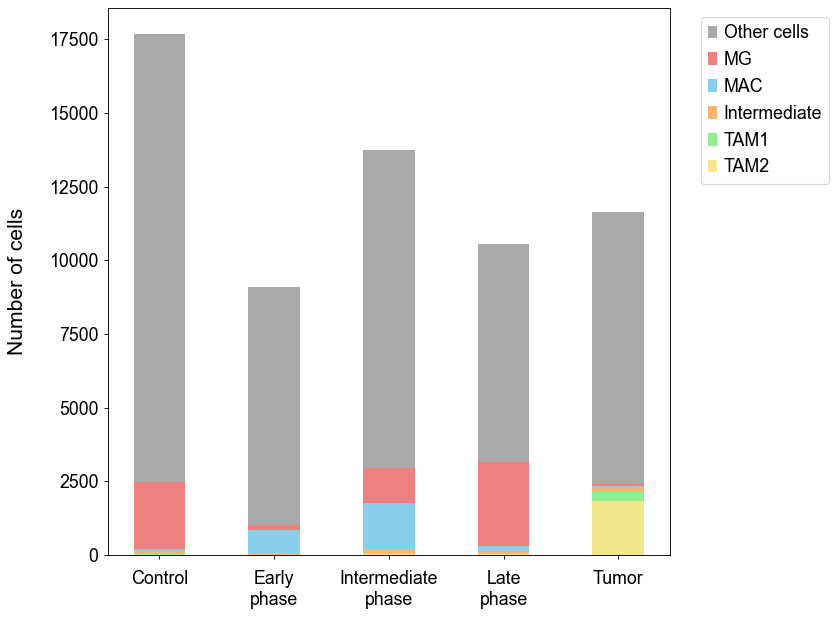

In [559]:
fig,ax = plt.subplots()
ax.bar(Hist_labels, adata0_Rest+adata1_MG+adata1_MAC+adata1_Int+adata1_TAM1+adata1_TAM2, Hist_width, label='Other cells', color='darkgray')
ax.bar(Hist_labels, adata1_MG+adata1_MAC+adata1_Int+adata1_TAM1+adata1_TAM2, Hist_width, label='MG', color='lightcoral')
ax.bar(Hist_labels, adata1_MAC+adata1_Int+adata1_TAM1+adata1_TAM2, Hist_width, label='MAC', color='skyblue')
ax.bar(Hist_labels, adata1_Int+adata1_TAM1+adata1_TAM2, Hist_width, label='Intermediate', color='#ffb370')
ax.bar(Hist_labels, adata1_TAM1+adata1_TAM2, Hist_width, label='TAM1', color='lightgreen')
ax.bar(Hist_labels, adata1_TAM2, Hist_width, label='TAM2', color='khaki')
               
ax.set_ylabel('Number of cells', fontsize=19, labelpad=20)
ax.legend()
plt.grid(False)
plt.legend(loc=1, bbox_to_anchor=(1.3,1), fontsize=16)
plt.tick_params(axis='x', labelsize = 16, pad = 10)
plt.tick_params(axis='y', labelsize=16, pad=5)

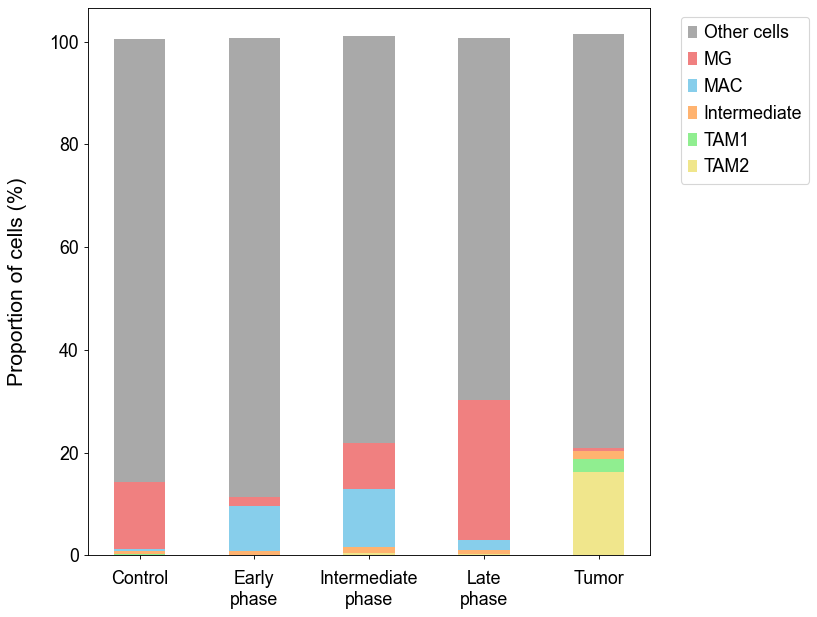

In [560]:
fig, ax = plt.subplots()
ax.bar(Hist_labels, adata0_Restw+adata1_MGw+adata1_MACw+adata1_Intw+adata1_TAM1w+adata1_TAM2w, Hist_width, label='Other cells', color='darkgray')
ax.bar(Hist_labels, adata1_MGw+adata1_MACw+adata1_Intw+adata1_TAM1w+adata1_TAM2w, Hist_width, label='MG', color='lightcoral')
ax.bar(Hist_labels, adata1_MACw+adata1_Intw+adata1_TAM1w+adata1_TAM2w, Hist_width, label='MAC', color='skyblue')
ax.bar(Hist_labels, adata1_Intw+adata1_TAM1w+adata1_TAM2w, Hist_width, label='Intermediate', color='#ffb370')
ax.bar(Hist_labels, adata1_TAM1w+adata1_TAM2w, Hist_width, label='TAM1', color='lightgreen')
ax.bar(Hist_labels, adata1_TAM2w, Hist_width, label='TAM2', color='khaki')
               
ax.set_ylabel('Proportion of cells (%)', fontsize=19, labelpad=20)
ax.legend()
plt.grid(False)
plt.legend(loc=1, bbox_to_anchor=(1.3,1), fontsize=16)
plt.tick_params(axis='x', labelsize = 16, pad = 10)
plt.tick_params(axis='y', labelsize=16, pad=5)

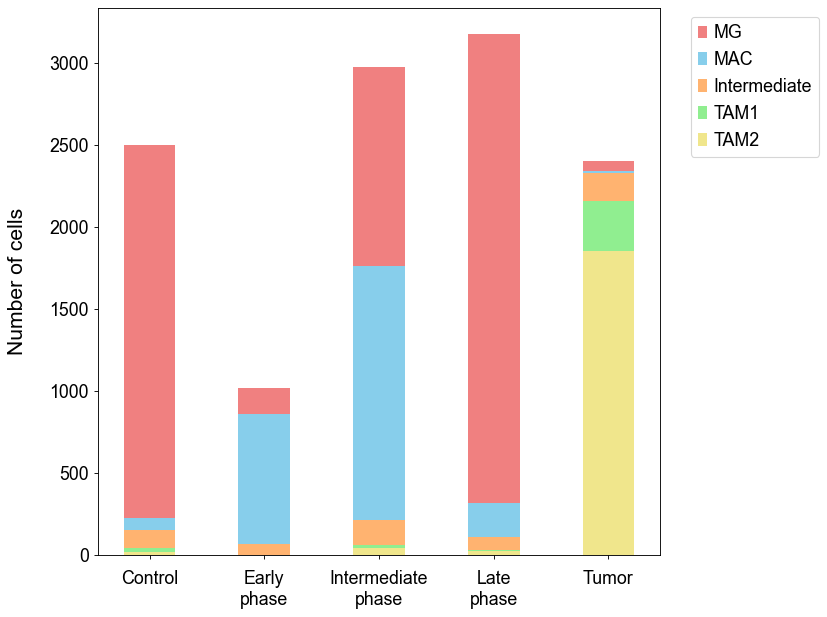

In [561]:
fig, ax = plt.subplots()
ax.bar(Hist_labels, adata1_MG+adata1_MAC+adata1_Int+adata1_TAM1+adata1_TAM2, Hist_width, label='MG', color='lightcoral')
ax.bar(Hist_labels, adata1_MAC+adata1_Int+adata1_TAM1+adata1_TAM2, Hist_width, label='MAC', color='skyblue')
ax.bar(Hist_labels, adata1_Int+adata1_TAM1+adata1_TAM2, Hist_width, label='Intermediate', color='#ffb370')
ax.bar(Hist_labels, adata1_TAM1+adata1_TAM2, Hist_width, label='TAM1', color='lightgreen')
ax.bar(Hist_labels, adata1_TAM2, Hist_width, label='TAM2', color='khaki')
               
ax.set_ylabel('Number of cells', fontsize=19, labelpad=20)
ax.legend()
plt.grid(False)
plt.legend(loc=1, bbox_to_anchor=(1.3,1), fontsize=16)
plt.tick_params(axis='x', labelsize = 16, pad = 10)
plt.tick_params(axis='y', labelsize=16, pad=5)

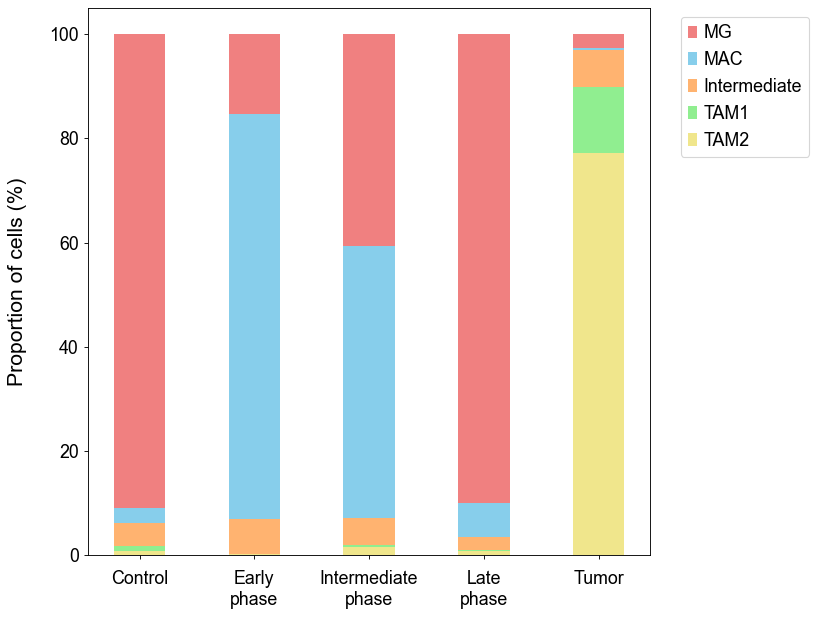

In [563]:
fig, ax = plt.subplots()
ax.bar(Hist_labels, adata1_MGp+adata1_MACp+adata1_Intp+adata1_TAM1p+adata1_TAM2p, Hist_width, label='MG', color='lightcoral')
ax.bar(Hist_labels, adata1_MACp+adata1_Intp+adata1_TAM1p+adata1_TAM2p, Hist_width, label='MAC', color='skyblue')
ax.bar(Hist_labels, adata1_Intp+adata1_TAM1p+adata1_TAM2p, Hist_width, label='Intermediate', color='#ffb370')
ax.bar(Hist_labels, adata1_TAM1p+adata1_TAM2p, Hist_width, label='TAM1', color='lightgreen')
ax.bar(Hist_labels, adata1_TAM2p, Hist_width, label='TAM2', color='khaki')
               
ax.set_ylabel('Proportion of cells (%)', fontsize=19, labelpad=20)
ax.legend()
plt.grid(False)
plt.legend(loc=1, bbox_to_anchor=(1.3,1), fontsize=16)
plt.tick_params(axis='x', labelsize = 16, pad = 10)
plt.tick_params(axis='y', labelsize=16, pad=5)

### Marker gene finding by Wilcoxon

In [52]:
sc.tl.rank_genes_groups(adata1, 'annotation1', method='wilcoxon')
pd.DataFrame(adata1.uns['rank_genes_groups']['names']).head(10).transpose()

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:23)


,0,1,2,3,4,5,6,7,8,9
B cell,Tmsb10,Cd79b,Rpl8,Cd79a,Igkc,H3f3a,Ighd,Rps27,Rps13,Rpl9
Homeostatic\nMG,P2ry12,Hexb,Selplg,Cx3cr1,Gpr34,Tmem119,Olfml3,Tgfbr1,Vsir,Cst3
Intermediate,Tyrobp,Apoe,mt-Atp6,Fth1,mt-Co3,Npc2,mt-Co2,Lyz2,mt-Nd4,Fcer1g
MAC,Mrc1,Stab1,Dab2,Pf4,Ms4a7,Selenop,F13a1,Pltp,Igfbp4,Gas6
Neuroprotective\nMG,Slc1a2,Clu,Atp1a2,Plpp3,Mt3,Cpe,Bcan,Aldoc,Ptn,mt-Cytb
Pro-inflammatory\nMG,Cd9,Ccl4,Ccl3,Cd83,Atf3,Id2,Bcl2a1b,Nfkbia,Csf1,Junb
Reactive\nMG(1),Junb,Egr1,Jun,Rhob,Btg2,Ier5,Zfp36,Ier2,Jund,Socs3
Reactive\nMG(2),Malat1,Gm42418,Son,mt-Nd4,mt-Cytb,mt-Nd2,Tgfbr1,Mef2c,mt-Atp6,Rrbp1
Reactive\nMG(3),Cst3,Meg3,Sparc,Ckb,Gpr34,Rgs10,Junb,Rhob,Jun,Crybb1
T cell,Rps15a,Rpl13,Tmsb10,Trbc2,Rpl18,Rps16,Rpl8,Rpl18a,Rpl9,Rpsa


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_annotation1']`


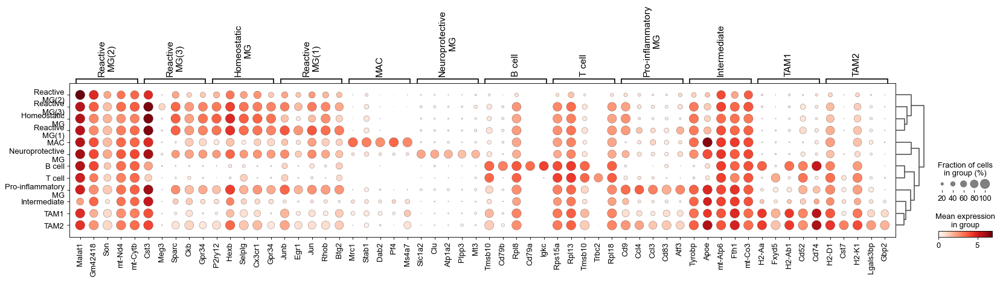

In [53]:
sc.tl.dendrogram(adata1, 'annotation1')
sc.pl.rank_genes_groups_dotplot(adata1, n_genes=5)

### Marker gene finding by pf.PJE

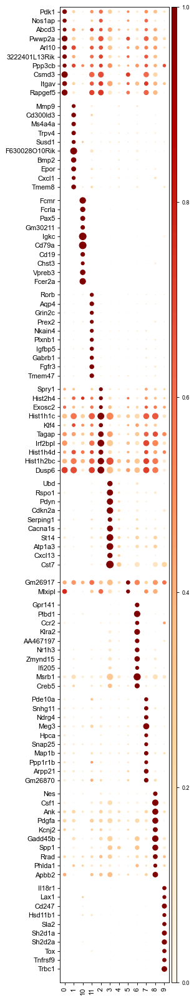

0 ['Pdk1', 'Nos1ap', 'Abcd3', 'Pwwp2a', 'Arl10', '3222401L13Rik', 'Ppp3cb', 'Csmd3', 'Itgav', 'Rapgef5']
1 ['Mmp9', 'Cd300ld3', 'Ms4a4a', 'Trpv4', 'Susd1', 'F630028O10Rik', 'Bmp2', 'Epor', 'Cxcl1', 'Tmem8']
10 ['Fcmr', 'Fcrla', 'Pax5', 'Gm30211', 'Igkc', 'Cd79a', 'Cd19', 'Chst3', 'Vpreb3', 'Fcer2a']
11 ['Rorb', 'Aqp4', 'Grin2c', 'Prex2', 'Nkain4', 'Plxnb1', 'Igfbp5', 'Gabrb1', 'Fgfr3', 'Tmem47']
2 ['Spry1', 'Hist2h4', 'Exosc2', 'Hist1h1c', 'Klf4', 'Tagap', 'Irf2bpl', 'Hist1h4d', 'Hist1h2bc', 'Dusp6']
3 ['Ubd', 'Rspo1', 'Pdyn', 'Cdkn2a', 'Serping1', 'Cacna1s', 'St14', 'Atp1a3', 'Cxcl13', 'Cst7']
4 []
5 ['Gm26917', 'Mlxipl']
6 ['Gpr141', 'Plbd1', 'Ccr2', 'Klra2', 'AA467197', 'Nr1h3', 'Zmynd15', 'Ifi205', 'Msrb1', 'Creb5']
7 ['Pde10a', 'Snhg11', 'Ndrg4', 'Meg3', 'Hpca', 'Snap25', 'Map1b', 'Ppp1r1b', 'Arpp21', 'Gm26870']
8 ['Nes', 'Csf1', 'Ank', 'Pdgfa', 'Kcnj2', 'Gadd45b', 'Spp1', 'Rrad', 'Phlda1', 'Apbb2']
9 ['Il18r1', 'Lax1', 'Cd247', 'Hsd11b1', 'Sla2', 'Sh2d1a', 'Sh2d2a', 'Tox', 'Tnfrs

In [61]:
M1 = marker(adata1,'cluster1')
marker_dict = M1.plot_marker()
for cluster, genes in marker_dict.items():
  print(cluster, genes)

### DEG heatmap

In [218]:
DEG = ['Tmem119', 'P2ry12', 'Hexb', 'Olfml3', 'Selplg', 'Gpr34',
       'Mrc1', 'Stab1', 'Dab2' ,'Pf4', 'Ms4a7',
       'Jun','Junb','Jund','Egr1','Rhob','Btg2','Ier2','Ier5']
       

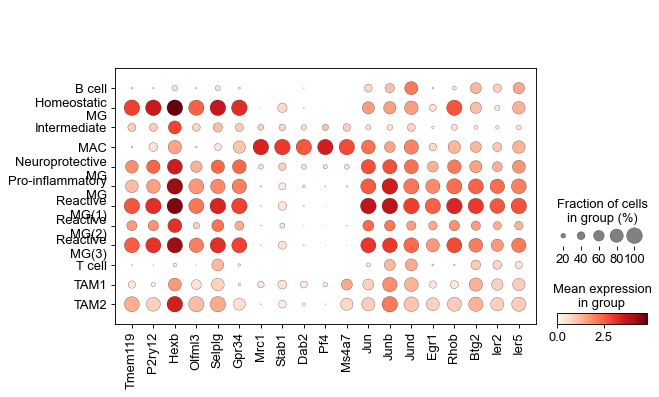

In [219]:
sc.pl.dotplot(adata1, DEG, 'annotation1')

### Timepoint 별 분석

In [564]:
print(len(adata0_1.obs),len(adata0_2.obs),len(adata0_3.obs),len(adata0_4.obs),len(adata0_5.obs))
print(len(adata1_1.obs),len(adata1_2.obs),len(adata1_3.obs),len(adata1_4.obs),len(adata1_5.obs))

17566 9014 13604 10475 11475
2603 1021 2971 3175 2451


Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


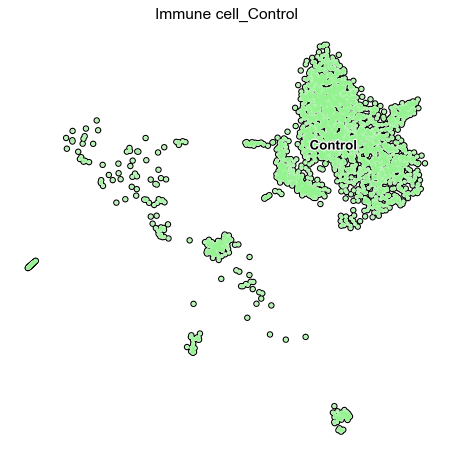

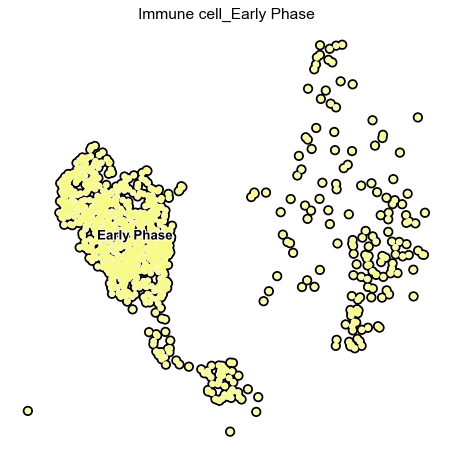

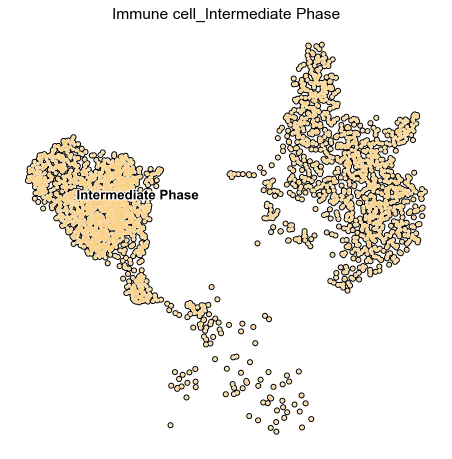

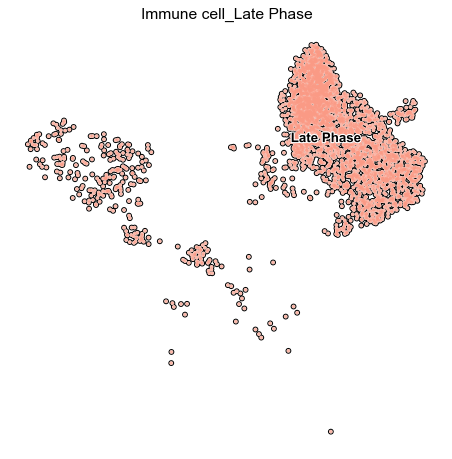

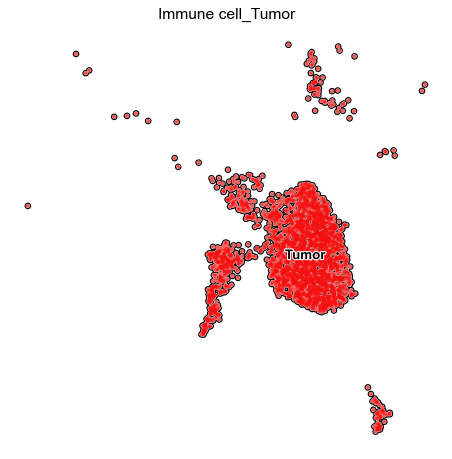

In [153]:
adata1_1.uns['Timepoint_colors'] = ['#93f38f']
adata1_2.uns['Timepoint_colors'] = ['#f8fa85']
adata1_3.uns['Timepoint_colors'] = ['#fad185']
adata1_4.uns['Timepoint_colors'] = ['#fa9a85']
adata1_5.uns['Timepoint_colors'] = ['#f31010']

rcParams['figure.figsize'] = 7,7
sc.pl.umap(adata1_1, color=['Timepoint'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell_Control'], frameon=False)
sc.pl.umap(adata1_2, color=['Timepoint'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell_Early Phase'], frameon=False)
sc.pl.umap(adata1_3, color=['Timepoint'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell_Intermediate Phase'], frameon=False)
sc.pl.umap(adata1_4, color=['Timepoint'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell_Late Phase'], frameon=False)
sc.pl.umap(adata1_5, color=['Timepoint'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell_Tumor'], frameon=False)

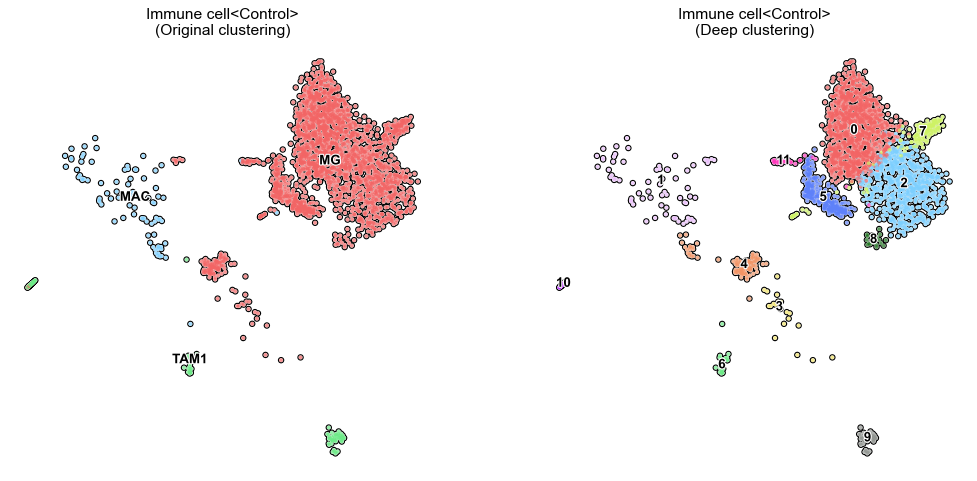

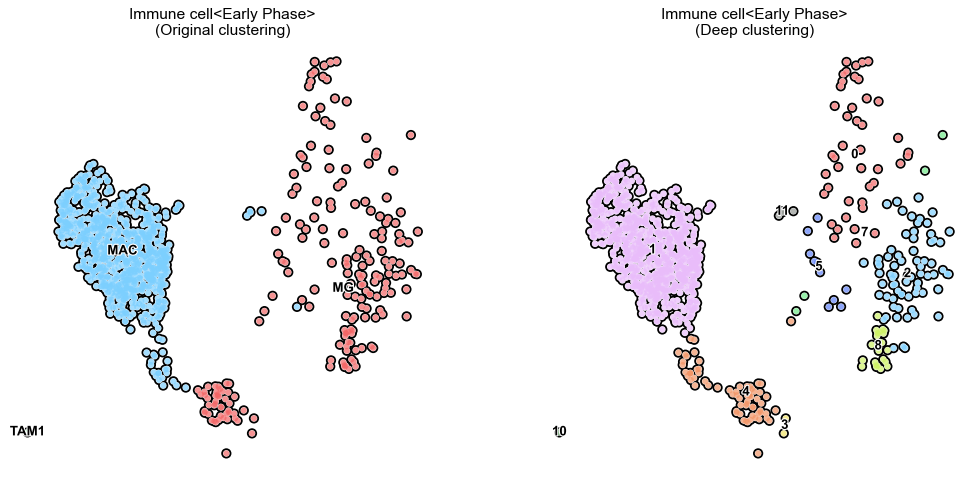

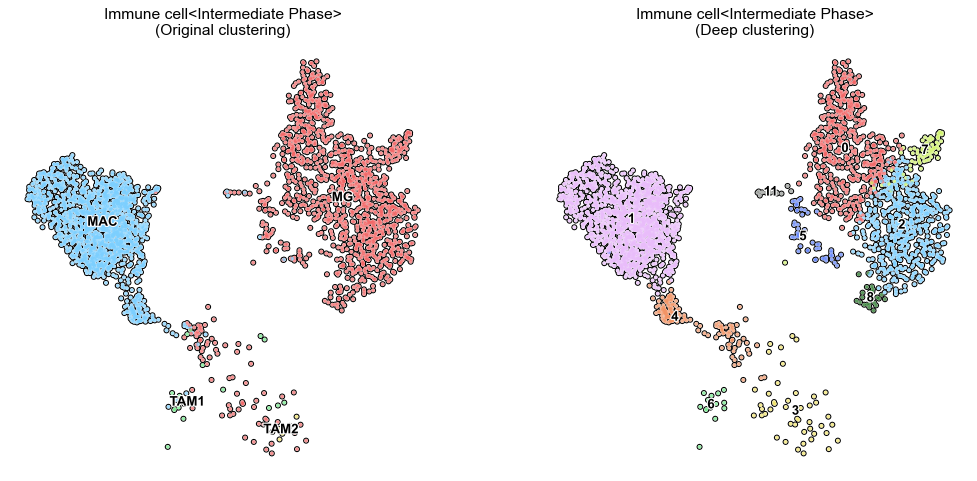

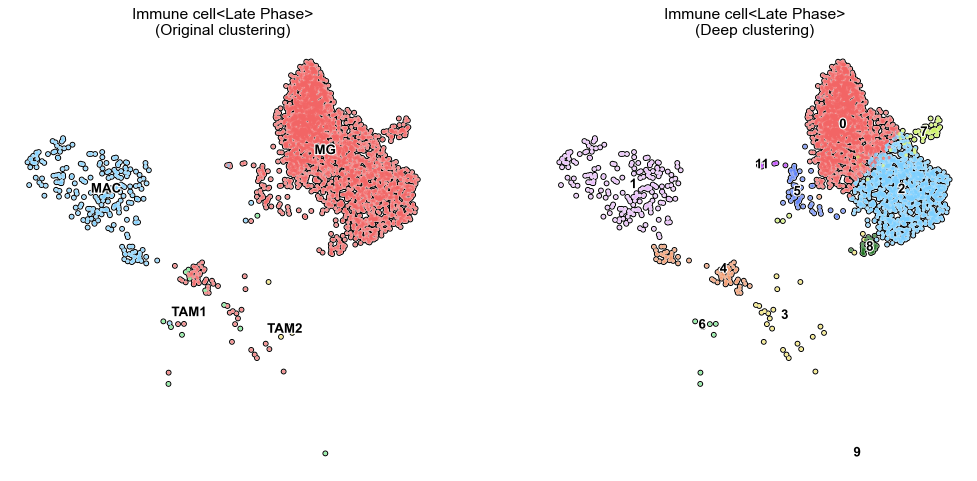

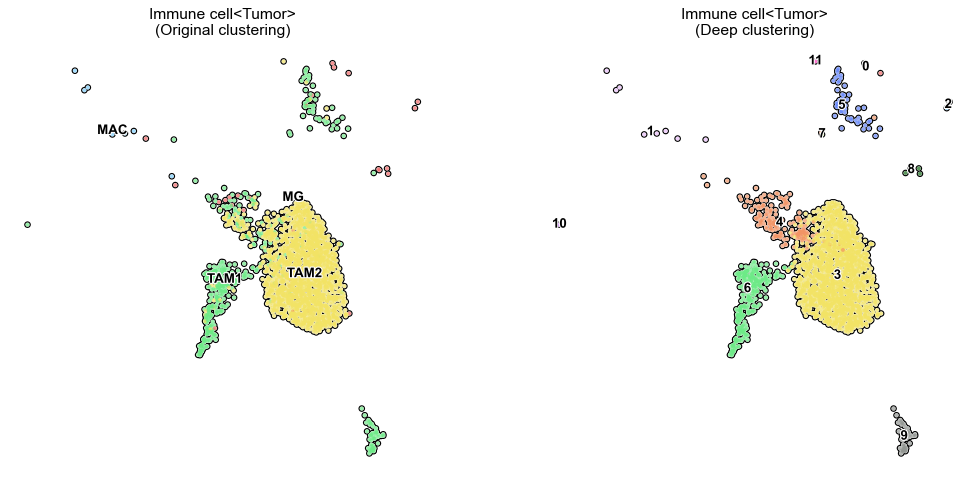

In [154]:
adata1_1.uns['cluster1_colors'] = ['#f26565', '#e9bcfa', '#7ccffe', '#f2e365', '#f29465', '#5e81f9', '#6dea87', '#cef265', '#176d18', '#929692', '#b931fd', '#fe38bc']
adata1_2.uns['cluster1_colors'] = ['#f26565', '#e9bcfa', '#7ccffe', '#f2e365', '#f29465', '#5e81f9', '#6dea87', '#cef265', '#176d18', '#929692', '#b931fd', '#fe38bc']
adata1_3.uns['cluster1_colors'] = ['#f26565', '#e9bcfa', '#7ccffe', '#f2e365', '#f29465', '#5e81f9', '#6dea87', '#cef265', '#176d18', '#929692', '#b931fd', '#fe38bc']
adata1_4.uns['cluster1_colors'] = ['#f26565', '#e9bcfa', '#7ccffe', '#f2e365', '#f29465', '#5e81f9', '#6dea87', '#cef265', '#176d18', '#929692', '#b931fd', '#fe38bc']
adata1_5.uns['cluster1_colors'] = ['#f26565', '#e9bcfa', '#7ccffe', '#f2e365', '#f29465', '#5e81f9', '#6dea87', '#cef265', '#176d18', '#929692', '#b931fd', '#fe38bc']

rcParams['figure.figsize'] = 7,7
sc.pl.umap(adata1_1, color=['cluster','cluster1'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell<Control>\n(Original clustering)','Immune cell<Control>\n(Deep clustering)'], 
           ncols=2, frameon=False)
sc.pl.umap(adata1_2, color=['cluster','cluster1'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell<Early Phase>\n(Original clustering)','Immune cell<Early Phase>\n(Deep clustering)'], 
           ncols=2, frameon=False)
sc.pl.umap(adata1_3, color=['cluster','cluster1'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell<Intermediate Phase>\n(Original clustering)','Immune cell<Intermediate Phase>\n(Deep clustering)'], 
           ncols=2, frameon=False)
sc.pl.umap(adata1_4, color=['cluster','cluster1'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell<Late Phase>\n(Original clustering)','Immune cell<Late Phase>\n(Deep clustering)'], 
           ncols=2, frameon=False)
sc.pl.umap(adata1_5, color=['cluster','cluster1'], add_outline=True, 
           legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, 
           title=['Immune cell<Tumor>\n(Original clustering)','Immune cell<Tumor>\n(Deep clustering)'], 
           ncols=2, frameon=False)

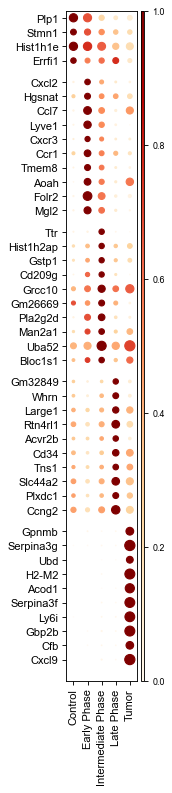

Control ['Plp1', 'Stmn1', 'Hist1h1e', 'Errfi1']


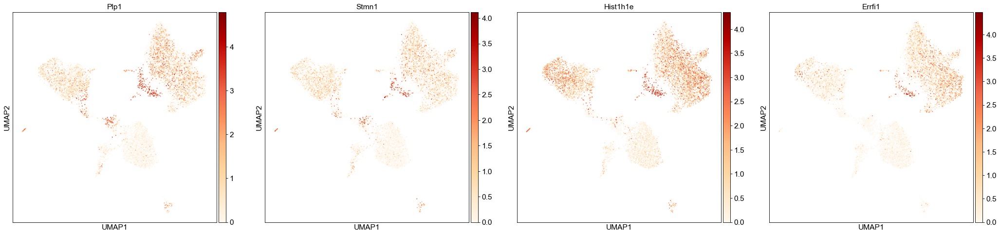

Early Phase ['Cxcl2', 'Hgsnat', 'Ccl7', 'Lyve1', 'Cxcr3', 'Ccr1', 'Tmem8', 'Aoah', 'Folr2', 'Mgl2']


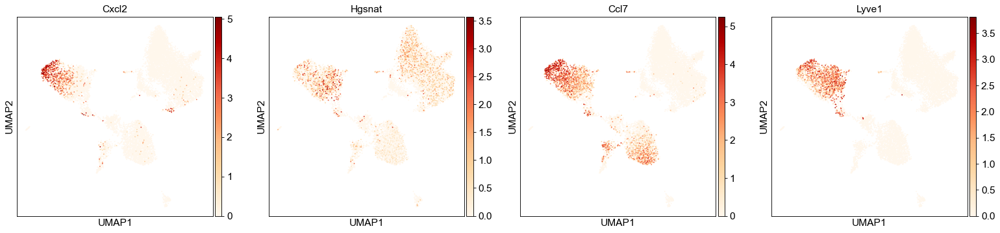

Intermediate Phase ['Ttr', 'Hist1h2ap', 'Gstp1', 'Cd209g', 'Grcc10', 'Gm26669', 'Pla2g2d', 'Man2a1', 'Uba52', 'Bloc1s1']


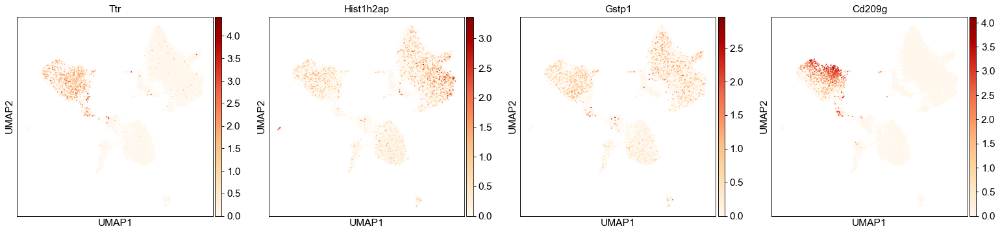

Late Phase ['Gm32849', 'Whrn', 'Large1', 'Rtn4rl1', 'Acvr2b', 'Cd34', 'Tns1', 'Slc44a2', 'Plxdc1', 'Ccng2']


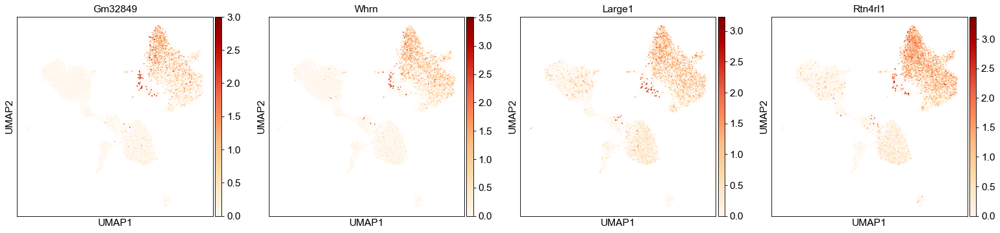

Tumor ['Gpnmb', 'Serpina3g', 'Ubd', 'H2-M2', 'Acod1', 'Serpina3f', 'Ly6i', 'Gbp2b', 'Cfb', 'Cxcl9']


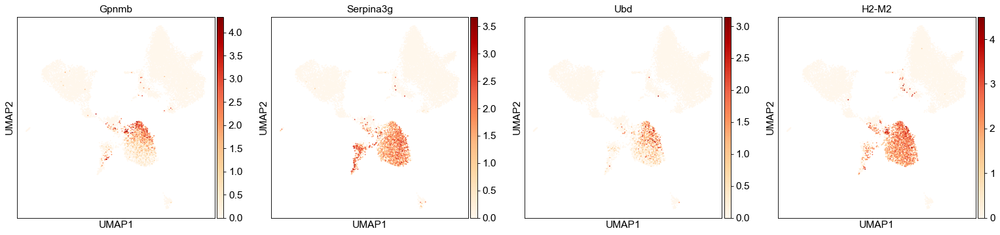

In [155]:
Mt = marker(adata1,'Timepoint')
marker_dict = Mt.plot_marker()

for cluster, genes in marker_dict.items():
  print(cluster, genes)
  us(adata1, marker_dict[cluster][:4])
  plt.show()

### Extra codes

In [ ]:
for gene in check: ## histogram 그리기
    print(gene)
    value=[]
    for n in range(len(immune.X)):
        value.append(immune.X[n][immune.var_names.str.startswith(gene).tolist().index(True)])    
    df = pd.DataFrame({"V" : value}, index=immune.obs_names.tolist())
    df = df.join(immune.obs['orig.ident'])
    ax = sns.boxplot(x='orig.ident', y="V", data=df, whis=2, palette=['#93f38f', '#f8fa85', '#fad185', '#fa9a85', '#f31010'])
    plt.setp(ax.get_xticklabels(), rotation=45)
    plt.show()

In [128]:
stackimmune1 = get_cluster_proportions(immune, 'annotation', 'orig.ident')
stackimmune1

NameError: name 'get_cluster_proportions' is not defined

In [ ]:
plot_cluster_proportions(stackimmune1)

In [ ]:
stackimmune2 = get_cluster_proportions(immune, 'celltype', 'orig.ident')
stackimmune2

In [ ]:
plot_cluster_proportions(stackimmune2)

In [ ]:
condition2 = immune.obs['annotation'].isin(['Microglia(1)','Microglia(2)','Microglia(3)'])

In [ ]:
microglia = sc.AnnData(immune[condition2].raw.X)
microglia.var = immune.raw.var
microglia.obs = immune.obs[condition2]
microglia.raw = microglia.copy()

In [ ]:
condition3 = immune.obs['annotation'].isin(['Macrophage(1)','Macrophage(2)','Macrophage(3)'])

In [ ]:
macrophage = sc.AnnData(immune[condition3].raw.X)
macrophage.var = immune.raw.var
macrophage.obs = immune.obs[condition3]
macrophage.raw = macrophage.copy()

In [ ]:
sc.pp.filter_genes_dispersion(microglia)
sc.pp.filter_genes_dispersion(macrophage)

In [ ]:
sc.pp.log1p(microglia)
sc.pp.scale(microglia,max_value=10)

In [ ]:
sc.pp.log1p(macrophage)
sc.pp.scale(macrophage,max_value=10)

In [ ]:
sc.pp.pca(microglia,n_comps = np.min([50,adata.X.shape[0],adata.X.shape[1]]))

In [ ]:
sc.pp.pca(macrophage,n_comps = np.min([50,adata.X.shape[0],adata.X.shape[1]]))

In [ ]:
sce.pp.harmony_integrate(microglia,'batch',adjusted_basis='X_pca')

In [ ]:
sce.pp.harmony_integrate(macrophage,'batch',adjusted_basis='X_pca')

In [ ]:
sc.pp.neighbors(microglia,n_pcs=15,n_neighbors=5)

In [ ]:
sc.pp.neighbors(macrophage,n_pcs=15,n_neighbors=5)

In [ ]:
sc.tl.umap(microglia)

In [ ]:
sc.tl.umap(macrophage)

In [ ]:
sc.tl.leiden(microglia, key_added='mcluster', resolution = 0.1)

In [ ]:
sc.tl.leiden(macrophage, key_added='mcluster', resolution = 0.1)

In [ ]:
rcParams['figure.figsize'] = 6,6
sc.pl.umap(microglia, color=['mcluster', 'orig.ident'], add_outline=True, legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, frameon=False, title = 'Microglia_subclustering', palette='Set1')

In [ ]:
rcParams['figure.figsize'] = 6,6
sc.pl.umap(macrophage, color=['mcluster', 'orig.ident'], add_outline=True, legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, frameon=False, title = 'Macrophage_subclustering', palette='Set1')

In [ ]:
M1 = annotater(microglia, 'annotation_microglia')

In [ ]:
M1.update(microglia, 'mcluster', '0', 'Microglia(1)')
M1.update(microglia, 'mcluster', '1', 'Microglia(2)')
M1.update(microglia, 'mcluster', '2', 'Microglia(3)')

In [ ]:
stackimmune3 = get_cluster_proportions(microglia, 'annotation_microglia', 'orig.ident')
stackimmune3

In [ ]:
plot_cluster_proportions(stackimmune3)

In [ ]:
M2 = annotater(macrophage, 'annotation_macrophage')

In [ ]:
M2.update(macrophage, 'mcluster', '0', 'Macrophage(1)')
M2.update(macrophage, 'mcluster', '1', 'Macrophage(2)')
M2.update(macrophage, 'mcluster', '2', 'Macrophage(3)')

In [ ]:
stackimmune4 = get_cluster_proportions(macrophage, 'annotation_macrophage', 'orig.ident')
stackimmune4

In [ ]:
plot_cluster_proportions(stackimmune4)

# Functions (by Pf. Park Jong Eun)

In [2]:
class marker():
    
    def __init__(self,adata,label,**kwargs):
        self.adata = adata
        self.label = label
        self.mks = find_markers(adata,label,**kwargs)
    
    def plot_marker(self,**kwargs):
        return show_marker_plot(self.adata,self.label,self.mks,**kwargs)
    
    def show_marker(self,celltype,**kwargs):
        return show_marker(self.mks,celltype,**kwargs)

# Marker gene analysis

def find_markers(adata,groupby,scanpy=None,single=True,thres=0.2,min_mean_cut=0.2, min_drop_cut=0.2,min_cnt_cut=10):
    adata.uns['cdm_'+groupby]=calculate_markers(adata,groupby) 
    if single==False:
        mks=find_markers_multiple(adata,adata.uns['cdm_'+groupby],
                                  thres=thres,min_mean_cut=min_mean_cut, 
                                  min_drop_cut=min_drop_cut, min_cnt_cut=min_cnt_cut)
    else:
        mks=find_markers_single(adata,adata.uns['cdm_'+groupby],
                                thres=thres,min_mean_cut=min_mean_cut, 
                                min_drop_cut=min_drop_cut, min_cnt_cut=min_cnt_cut)
    if scanpy:
        sc.tl.rank_genes_groups(adata,groupby)
        adata.uns['rnk']=pd.DataFrame(adata.uns['rank_genes_groups']['names'])
    return mks

def calculate_markers(adata,group_key,exclude = None, cnt_cut=0, tot_cnt_cut=0):

    # group_key = 'louvain'
    # tot_cnt_cut = minimum cell number for ct, default 0, no cut here
    # cnt_cut = minumum cell number of expressing that gene per cell, otherwise, 0

    ctlist = np.array(sorted(list(set(adata.obs[group_key]))))
    
    if exclude:
        ctlist = [x for x in ctlist if x not in exclude]
    
    mtx = adata.raw
    len_gene = mtx.X.shape[1]

    mean_dt = {}
    cnt_dt = {}
    drop_dt = {}

    for ct in ctlist:
        ct_cond = np.array(adata.obs[group_key]==ct)
        if np.sum(ct_cond)<tot_cnt_cut:
            continue
        #print(ct)
        len_ct = np.sum(ct_cond)
        mtx_ct = mtx.X[ct_cond]
        pos_count = Counter(mtx_ct.nonzero()[1])
        cnt_arr = np.zeros(len_gene)
        for pos in pos_count:
            cnt_arr[pos] = pos_count[pos]
        cnt_dt[ct] = cnt_arr
        cnt_mask = (cnt_arr<cnt_cut)
        drop_dt[ct] = cnt_arr/len_ct
        mean_arr = np.matrix(np.mean(mtx_ct,axis=0)).A1
        mean_arr[cnt_mask] = 0
        mean_dt[ct] = mean_arr
    
    cdm_out = {"cnt":cnt_dt, "drop":drop_dt, "mean":mean_dt}
    return cdm_out


def find_markers_groups(adata, cdm_out, groups, thres = 0.2, min_exp_cut=0.1, min_cnt_cut = 5):
    # Select marker gene (multiple)
     
    cnt_dt = cdm_out["cnt"]
    drop_dt = cdm_out["drop"]
    mean_dt = cdm_out["mean"]
    
    ctlist = np.array(sorted(list(drop_dt.keys())))
    marker_group = []
    thres = thres

    for k,gname in enumerate(adata.raw.var_names):  
        x1 = []
        y1 = []
        ct_selected = []
        for ct in ctlist:
            if cnt_dt[ct][k] < min_cnt_cut:
                continue
            x1.append(drop_dt[ct][k]) # get expratio
            y1.append(mean_dt[ct][k]) # get expmean
            ct_selected.append(ct)
        x1 = np.array(x1)
        y1 = np.array(y1)
        if len(y1) == 0:
            continue
        y1 = y1/np.max(y1)
        # sort expratio, expmean, celltypelist
        
        is_group = np.array([x in (groups) for x in ct_selected])
        try: max_y1 = np.max(y1[~is_group])
        except: max_y1 = 0
        try: min_y1 = np.min(y1[is_group])
        except: min_y1 = 0
        
        dff = min_y1-max_y1
        cond = dff>thres
            
        if cond:
            chgpos = (np.where(cond)[0][0])+1
            out = 1
            for i,ct_high in enumerate(list(groups)):
                if mean_dt[ct_high][k] < min_exp_cut:
                    out = 0
            if out == 1:
                marker_group.append((gname,dff)) 
    return  marker_group


def find_markers_multiple(adata, cdm_out, thres = 0.2, min_mean_cut=0.2, min_drop_cut=0.2, min_cnt_cut = 0):
    # Select marker gene (multiple)
    
    cnt_dt = cdm_out["cnt"]
    drop_dt = cdm_out["drop"]
    mean_dt = cdm_out["mean"]
    
    ctlist = np.array(sorted(list(drop_dt.keys())))
    marker_multiple = defaultdict(list)
    thres = thres

    for k,gname in enumerate(adata.raw.var_names):  
        x1 = []
        y1 = []
        ct_selected = []
        for ct in ctlist:
            if cnt_dt[ct][k] < min_cnt_cut:
                continue
            x1.append(drop_dt[ct][k]) # get expratio
            y1.append(mean_dt[ct][k]) # get expmean
            ct_selected.append(ct)
            
        x1 = np.array(x1)
        y1 = np.array(y1)
        if len(y1) == 0:
            continue
        y1 = y1/np.max(y1)
        # sort expratio, expmean, celltypelist
        idx = np.argsort(y1)
        x1 = x1[idx]
        y1 = y1[idx]
        ctlist_sorted = np.array(ct_selected)[idx]
        
        dff = (np.diff(y1))
        cond = dff>thres

        if any(cond):
            chgpos = (np.where(cond)[0][0])
            ct_high = ctlist_sorted[-1]
            if mean_dt[ct_high][k] < min_mean_cut:
                pass
            elif drop_dt[ct_high][k] < min_drop_cut:
                pass
            else:
                marker_multiple[ct_high].append((gname,dff[chgpos]))   
    return  marker_multiple

def find_markers_single(adata, cdm_out, thres = 0.2, min_mean_cut=0.2, min_drop_cut=0.2, min_cnt_cut = 0):
    # Select marker gene (single)
  
    cnt_dt = cdm_out["cnt"]
    drop_dt = cdm_out["drop"]
    mean_dt = cdm_out["mean"]
    
    ctlist = np.array(sorted(list(drop_dt.keys())))
    marker_single = defaultdict(list)

    for k,gname in enumerate(adata.raw.var_names):  
        x1 = []
        y1 = []
        ct_selected = []
        cond = False
        for ct in ctlist:
            if cnt_dt[ct][k] < min_cnt_cut:
                continue
            x1.append(drop_dt[ct][k]) # get expratio
            y1.append(mean_dt[ct][k]) # get expmean
            ct_selected.append(ct)
        if len(y1)==0:
            continue
        else:
            y1 = y1/np.max(y1)
            if len(y1)==1:
                if y1[0]>thres:
                    if mean_dt[ct_selected[0]][k] < min_mean_cut:
                        pass
                    elif drop_dt[ct_selected[0]][k] < min_drop_cut:
                        pass
                    else:
                        marker_single[ct_selected[0]].append((gname,y1[0]))
                else:
                    pass
            else:
                x1 = np.array(x1)
                y1 = np.array(y1)
                # sort expratio, expmean, celltypelist
                idx = np.argsort(y1)
                x1 = x1[idx]
                y1 = y1[idx]    
                ctlist_sorted = np.array(ct_selected)[idx]

                dff = (np.diff(y1))
                cond = dff[-1]>thres

                if cond==True:
                    ct_high = ctlist_sorted[-1] 
                    if mean_dt[ct_high][k] < min_mean_cut:
                        pass
                    elif drop_dt[ct_high][k] < min_drop_cut:
                        pass
                    else:
                        marker_single[ct_high].append((gname,dff[-1]))
    return marker_single 

def find_markers_negative(adata, cdm_out, ctlist = None, thres = 0.2, min_exp_cut=0.1):
    # Select marker gene (single)
  
    cnt_dt = cdm_out["cnt"]
    drop_dt = cdm_out["drop"]
    mean_dt = cdm_out["mean"]
    
    if ctlist == None:
        ctlist = np.array(sorted(list(drop_dt.keys())))
        
    marker_single = defaultdict(list)
    thres = thres

    for k,gname in enumerate(adata.raw.var_names):  
        x1 = []
        y1 = []
        ct_selected = []
        cond = False
        max_value = 0.0
        for ct in ctlist:
            max_value = np.max([max_value, mean_dt[ct][k]])
            x1.append(drop_dt[ct][k]) # get expratio
            y1.append(mean_dt[ct][k]) # get expmean
            ct_selected.append(ct)
        if max_value < min_exp_cut:
            continue
        else:
            y1 = y1/np.max(y1)
            x1 = np.array(x1)
            y1 = np.array(y1)
            # sort expratio, expmean, celltypelist
            idx = np.argsort(y1)
            x1 = x1[idx]
            y1 = y1[idx]
            ctlist_sorted = np.array(ct_selected)[idx]

            dff = (np.diff(y1))
            if gname == 'ENSG00000168685':
                print(ctlist_sorted)
                print(y1)
                print(dff)
            cond = dff[0]>thres

            if cond==True:
                ct_high = ctlist_sorted[0] 
                marker_single[ct_high].append((gname,dff[0]))
    for ct in list(marker_single.keys()):
        marker_single[ct] = sorted([(geneID,drop) for geneID,drop in marker_single[ct]],key=lambda x:-x[1])
    return marker_single 


def show_marker(marker_output, celltype=None, toshow=40, result=False):
    if celltype == None:
        if result == True:
            return sorted([(geneID,drop) for geneID,drop in marker_output],key=lambda x:-x[1])[0:toshow]
        else:
            print(sorted([(geneID,drop) for geneID,drop in marker_output],key=lambda x:-x[1])[0:toshow])
    else:
        if result == True:
            return sorted([(geneID,drop) for geneID,drop in marker_output[celltype]],key=lambda x:-x[1])[0:toshow]
        else:
            print(sorted([(geneID,drop) for geneID,drop in marker_output[celltype]],key=lambda x:-x[1])[0:toshow])

def show_marker_plot(adata,anno_key,mks,toshow=10,T=False):
    mklist = []
    ct_list = sorted(adata.uns['cdm_'+anno_key]['cnt'].keys())
    #ct_list = sorted(ct_list,key=lambda x:int(x))
    report_mks = {}
    
    for ct in ct_list:
        
        try:
            ct_mks = [x[0] for x in show_marker(mks,celltype=ct,result=True)][0:toshow]
        except:
            ct_mks = [' ']
        mklist.extend(ct_mks)
        mklist.append(' ')
        report_mks[ct] = ct_mks
        
    if T:
        draw_marker_blob_T(adata,adata.uns['cdm_'+anno_key],mklist,ctlist=ct_list)
    else:
        draw_marker_blob(adata,adata.uns['cdm_'+anno_key],mklist,ctlist=ct_list,min_drop_ratio=0.0)
    return(report_mks)


def draw_marker(adata, gene, cdm_out, min_cnt_cut = 0):
    

    cnt_dt = cdm_out["cnt"]
    drop_dt = cdm_out["drop"]
    mean_dt = cdm_out["mean"]
    
    ctlist = np.array(sorted(list(drop_dt.keys())))
    k = np.where(adata.raw.var_names == gene)[0][0]
    x1 = []
    y1 = []
    ct_selected = []
    for ct in ctlist:
        if cnt_dt[ct][k] < min_cnt_cut:
            continue
        x1.append(drop_dt[ct][k])
        y1.append(mean_dt[ct][k])
        ct_selected.append(ct)
    plt.figure(figsize=(5,5))
    plt.scatter(x1,y1)
    for i, ct in enumerate(ct_selected):
        plt.annotate(ct,(x1[i],y1[i]),fontsize=10)
    plt.title(gene)
    plt.xlim(0,1)
    plt.xlabel("ratio cells detected")
    plt.ylabel("mean exp")
    plt.grid(False)
    plt.show()
    
    return(x1,y1,ct_selected)

def draw_marker_v2(adata, gene, anno_key, cs, show=True,show_cut = 0.2):
    
    from adjustText import adjust_text

    cdm_out = adata.uns['cdm_%s'%(anno_key)]
    
    cnt_dt = cdm_out["cnt"]
    drop_dt = cdm_out["drop"]
    mean_dt = cdm_out["mean"]
    
    ctlist = np.array([x for x in sorted(list(drop_dt.keys())) if x in set(adata.obs[anno_key])])
    
    k = np.where(adata.raw.var_names == gene)[0][0]
    x1 = []
    y1 = []
    ct_selected = []
    cls = []
    for ct in ctlist:
        if cnt_dt[ct][k] < 0:
            continue
        x1.append(drop_dt[ct][k])
        y1.append(mean_dt[ct][k])
        ct_selected.append(ct)
        cls.append(cs[ct])
    plt.figure(figsize=(5,5))
    plt.scatter(x1,y1,color=cls)

    texts = []
    for i, txt in enumerate(ct_selected):
        if ((x1[i] < show_cut) & (y1[i] < show_cut)):
            continue
        texts.append(plt.text(x1[i],y1[i],txt,fontsize=10,color=cs[txt]))
        
    plt.title(gene)
    plt.xlim(0,max(x1)+0.1)
    plt.xlabel("ratio cells detected")
    plt.ylabel("mean exp")
    plt.grid(False)
    adjust_text(texts,only_move={'texts':'xy'},lim=3)
    if show:
        plt.show() 


def draw_marker_blob_v2(adata,cdm_out,genes,ctlist = None,fontsize=10,
                     figscale=0.25,save=None, show=True,
                     min_drop_ratio=0.01,cmap='OrRd',offset=0.5,normed=False):

    def get_drop(ct,drop_dt,min_drop_ratio):
        if ct in drop_dt:
            drop = drop_dt[ct][k]
            if drop > min_drop_ratio:
                return drop
            else:
                return 0
        else:
            return 0
        
    
    cnt_dt = cdm_out["cnt"]
    drop_dt = cdm_out["drop"]
    mean_dt = cdm_out["mean"]
    
    if ctlist == None:
        ctlist = np.array(sorted(list(drop_dt.keys())))

    xpos = []
    ypos = []
    yticks = []
    yticklabels = []

    x1 = []
    y1 = []

    yidx = 0
    
    xpos_list = []
    xticks = []
    offset = 0
    
    for i,ct in enumerate(ctlist):
        if ct not in mean_dt:
            offset -= offset
        else:
            xticks.append(i+offset)
        xpos_list.append(i+offset)
    
    
    for gene in genes[::-1]:

        if gene in adata.raw.var_names:
            yidx += 1
            k = np.where(adata.raw.var_names == gene)[0][0]
            
            ymax = np.max(np.array([mean_dt[ct][k] if ct in mean_dt else 0 for ct in list(mean_dt.keys())]))

            x1.extend([get_drop(ct,drop_dt,min_drop_ratio) for ct in ctlist])
            y0 = np.array([mean_dt[ct][k] if ct in mean_dt else 0 for ct in ctlist])
            if normed:
                y1.extend(list(y0/np.max(y0)))
            else:
                y1.extend(list(y0/ymax))
            yticks.append(yidx)
            yticklabels.append(gene)
            
        else:

            yidx += 0.5
            x1.extend([0]*len(ctlist))
            y1.extend([0]*len(ctlist))
                                   
        xpos.extend(xpos_list)
        ypos.extend([yidx]*len(ctlist))

    x1 = np.array(x1)
    y1 = np.array(y1)
    
    fig = plt.figure(figsize=(len(ctlist)*figscale,len(genes)*figscale*0.9))
    ax = fig.add_subplot(1,1,1)
    sc = ax.scatter(xpos,ypos,s=x1*figscale*400,c=y1,cmap=cmap)
    ax.set_yticks(yticks)
    ax.set_yticklabels(yticklabels,fontsize=fontsize)
    ax.set_xticks(xticks)
    ax.set_xticklabels([x for x in ctlist if x in mean_dt],rotation=90,fontsize=fontsize)
    ax.set_ylim(min(ypos)-0.5,max(ypos)+0.5)
    ax.set_xlim(min(xpos)-0.5,max(xpos)+0.5)
    plt.grid(False)
    
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(sc,cax=cax)
    cbar.ax.tick_params(labelsize=8) 
    
    if save:
        plt.savefig(save,format='pdf')
    if show:
        plt.show()
    
def draw_marker_blob(adata,cdm_out,genes,ctlist = None,fontsize=10,
                     figscale=0.25,save=None, show=True,
                     min_drop_ratio=0.01,cmap='OrRd'):

    cnt_dt = cdm_out["cnt"]
    drop_dt = cdm_out["drop"]
    mean_dt = cdm_out["mean"]
    
    if ctlist == None:
        ctlist = np.array(sorted(list(drop_dt.keys())))

    xpos = []
    ypos = []
    yticks = []
    yticklabels = []

    x1 = []
    y1 = []

    yidx = 0
    
    for gene in genes[::-1]:

        if gene in adata.raw.var_names:
            yidx += 1
            k = np.where(adata.raw.var_names == gene)[0][0]

            x1.extend([drop_dt[ct][k] if ((drop_dt[ct][k] > min_drop_ratio)) else 0 for ct in ctlist])
            y0 = np.array([mean_dt[ct][k] for ct in ctlist])
            y1.extend(list(y0/np.max(y0)))
            
            yticks.append(yidx)
            yticklabels.append(gene)
            
        else:

            yidx += 0.5
            x1.extend([0]*len(ctlist))
            y1.extend([0]*len(ctlist))
                                   
        xpos.extend(list(range(len(ctlist))))
        ypos.extend([yidx]*len(ctlist))

    x1 = np.array(x1)
    y1 = np.array(y1)
    
    fig = plt.figure(figsize=(len(ctlist)*figscale,len(genes)*figscale*0.9))
    ax = fig.add_subplot(1,1,1)
    sc = ax.scatter(xpos,ypos,s=x1*figscale*400,c=y1,cmap=cmap)
    ax.set_yticks(yticks)
    ax.set_yticklabels(yticklabels,fontsize=fontsize)
    ax.set_xticks(range(len(ctlist)))
    ax.set_xticklabels(ctlist,rotation=90,fontsize=fontsize)
    ax.set_ylim(min(ypos)-0.5,max(ypos)+0.5)
    ax.set_xlim(min(xpos)-0.5,max(xpos)+0.5)
    plt.grid(False)
    
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(sc,cax=cax)
    cbar.ax.tick_params(labelsize=8) 
    
    if save:
        plt.savefig(save,format='pdf')
    if show:
        plt.show()
    

def draw_marker_blob_T(adata,cdm_out,genes,ctlist = None,fontsize=10, figscale=0.25,cmap=None,save=None):
    
    if cmap == None:
        cmap='OrRd'

    cnt_dt = cdm_out["cnt"]
    drop_dt = cdm_out["drop"]
    mean_dt = cdm_out["mean"]
    
    if ctlist == None:
        ctlist = np.array(sorted(list(drop_dt.keys())))
    totlist = np.array(sorted(list(drop_dt.keys())))

    xpos = []
    ypos = []
    xticks = []
    xticklabels = []

    x1 = []
    y1 = []

    xidx = 0
    
    ctlist = ctlist[::-1]
    
    for gene in genes:

        if gene in adata.raw.var_names:
            xidx += 1
            k = np.where(adata.raw.var_names == gene)[0][0]

            y1.extend([drop_dt[ct][k] if drop_dt[ct][k] > 0.01 else 0 for ct in ctlist])
            x0 = np.array([mean_dt[ct][k] for ct in ctlist])
            xt = np.array([mean_dt[ct][k] for ct in totlist])
            x1.extend(list(x0/np.max(x0)))
            #x1.extend(list(x0/np.max(xt)))
            
            xticks.append(xidx)
            xticklabels.append(gene)
            
        else:

            xidx += 0.5
            y1.extend([0]*len(ctlist))
            x1.extend([0]*len(ctlist))
                                   
        ypos.extend(list(range(len(ctlist))))
        xpos.extend([xidx]*len(ctlist))

    x1 = np.array(x1)
    y1 = np.array(y1)
    
    
    fig = plt.figure(figsize=(len(genes)*figscale*0.7,len(ctlist)*figscale*0.8))
    ax = fig.add_subplot(1,1,1)
    sc = ax.scatter(xpos,ypos,s=y1*figscale*400,c=x1,cmap=cmap,vmax=1.0)
    ax.xaxis.tick_top()
    ax.set_xticks(np.array(xticks))
    ax.set_xticklabels(xticklabels,rotation=90,fontsize=fontsize)
    ax.set_yticks(range(len(ctlist)))
    ax.set_yticklabels(ctlist,fontsize=fontsize)
    ax.set_ylim(min(ypos)-0.5,max(ypos)+0.5)
    ax.set_xlim(min(xpos)-0.5,max(xpos)+0.5)
    plt.grid(False)
    
    from mpl_toolkits.axes_grid1 import make_axes_locatableg
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="2%", pad=0.05)
    cbar = plt.colorbar(sc,cax=cax)
    cbar.ax.tick_params(labelsize=8) 
    if save != None:
        plt.savefig(save,bbox_inches='tight',format='pdf',dpi=300)
    plt.show()

class volcano_plot():
    '''
    creat volcano plot from anndata
    '''
    
    def __init__(self,adata,anno_key,comp1,comp2,P=0.01,quick=True, normalise=False,
                fc_cut_pval = 0.5, n_pos_pval=5):
        '''
        param P :pseudocount for fc calculation
        '''
        from scipy.stats import ttest_ind
        self.genelist = adata.raw.var_names
        index1 = adata.obs[anno_key]==comp1
        index2 = adata.obs[anno_key]==comp2

        exp1 = adata.raw[index1].X.todense()
        exp2 = adata.raw[index2].X.todense()
        
        self.pval = []
        self.fc = []
        self.n_max = []
        
        if normalise:
            median1 = np.log(np.median(adata.obs['n_counts'][index1]))
            median2 = np.log(np.median(adata.obs['n_counts'][index2]))
        else:
            median1 = 1
            median2 = 1
        
        for i in range(adata.raw.shape[1]):
            
            n_pos1 = np.sum(exp1[:,i].A1>0)
            n_pos2 = np.sum(exp2[:,i].A1>0)
            n_max = np.max([n_pos1,n_pos2])
            
            self.n_max.append(n_max)
            
            count1 = np.mean(exp1[:,i].A1)
            count2 = np.mean(exp2[:,i].A1)
            
            norm_count1 = count1*(1/median1)+P
            norm_count2 = count2*(1/median2)+P
            
            #print(count1, count2, norm_count1, norm_count2)
            
            self.fc.append(np.log2(norm_count1 / norm_count2))
                           
            if quick:
                if np.abs(self.fc[-1])< fc_cut_pval:
                    self.pval.append(1)
                elif n_max < n_pos_pval:
                    self.pval.append(1)
                else:
                    self.pval.append(ttest_ind(exp1[:,i].A1*(1/median1), exp2[:,i].A1*(1/median2))[1])
            else:
                self.pval.append(ttest_ind(exp1[:,i].A1*(1/median1), exp2[:,i].A1*(1/median2))[1])
            
        self.pval = np.array(self.pval)
        self.fc = np.array(self.fc)
        self.n_max = np.array(self.n_max)
            
    def draw(self, title=None, pvalue_cut=100, to_show = 0.2, adjust_lim = 5, show=True, sig_mode = 'auto',adjust = True):
        '''
        draw volcano plot
        param pvalue_cut :-log10Pvalue for cutoff
        sig_mode: ['auto','complex','pval']
        '''
        from adjustText import adjust_text
        plt.figure(figsize=(6,6))

        xpos = np.array(self.fc)
        ypos = -np.log10(np.array(self.pval))
        ypos[ypos==np.inf] = np.max(ypos[ypos!=np.inf])

        if sig_mode == 'complex':
            index = (np.abs(xpos))*ypos
            index_cut = np.percentile(index,100-to_show)
            sig = (np.abs(xpos) > 1) & (ypos > 2) & ((np.abs(xpos))*ypos > index_cut)
        elif sig_mode =='pval':
            sig = (np.abs(xpos) > 1) & (ypos > pvalue_cut)
        elif sig_mode =='auto':
            index_cut = np.percentile(ypos,100-to_show)
            sig = (np.abs(xpos) > 1) & (ypos > index_cut)
        else:
            print('error, check sig_mode')
            raise SystemError

        if title:
            plt.title(title)
        plt.xlabel('log2FoldChange')
        plt.ylabel('-log10Pval')
        plt.scatter(xpos,ypos,s=1, color='k', alpha =0.5, rasterized=True)
        plt.scatter(xpos[sig],ypos[sig],s=3,color='red', rasterized=True)

        texts = []
        for i, gene in enumerate(self.genelist[sig]):
            texts.append(plt.text(xpos[sig][i],ypos[sig][i],gene,fontsize=5))
        
        if adjust:
            adjust_text(texts,only_move={'texts':'xy'},lim=adjust_lim)
        else:
            pass
        if show:
            plt.show() 

cc_genes = ['C1orf112', 'KDM1A', 'ARHGAP33', 'CDC27', 'AC004381.6', 'DBF4', 'PRSS21', 'E2F2', 'BAZ1B', 'NCAPD2', 'ANLN', 'BRCA1', 'UBR7', 'DDX11', 'TACC3', 'POLA2', 'DEPDC1', 'NCAPH2', 'HMGB3', 'CENPQ', 'DEPDC1B', 'SPDL1', 'TDP1', 'DSG2', 'NOP16', 'RFC2', 'RAD51', 'POLQ', 'THOC3', 'MRTO4', 'C4orf27', 'POLD1', 'TM7SF3', 'MCM10', 'MTHFD2', 'YBX1', 'ASPM', 'PRR11', 'NUCKS1', 'EXOC5', 'TCOF1', 'RAD18', 'TRIP13', 'DAZAP1', 'HLTF', 'PDCD2', 'SMC1A', 'HMMR', 'MCM2', 'NUP37', 'GTSE1', 'WDR62', 'MCM6', 'MLH1', 'UNG', 'SPAG5', 'UBE2T', 'EXOSC5', 'FAM76B', 'POLD3', 'KIF22', 'PUM3', 'RBL1', 'NDC80', 'HSPB11', 'OXCT1', 'SEH1L', 'ORC1', 'RAD54L', 'NOP14', 'GMCL1', 'AURKA', 'TPX2', 'BIRC5', 'KIF4A', 'FH', 'ORC6', 'G2E3', 'WDR76', 'PHGDH', 'CLSPN', 'NUP50', 'CDC45', 'CDC6', 'CBX5', 'MSH2', 'FKBP5', 'ACOT7', 'CDC7', 'RANBP1', 'CENPM', 'HMGXB4', 'MCM5', 'RANGAP1', 'POLE2', 'CDKN3', 'ERH', 'MTHFD1', 'VRK1', 'EMC9', 'GINS1', 'MYBL2', 'CDC25B', 'PLCB4', 'FAM83D', 'CEP76', 'RBBP8', 'POLA1', 'NUP93', 'CTCF', 'CCP110', 'CEP152', 'OIP5', 'MYEF2', 'MCM4', 'KCTD9', 'RNASEH2A', 'SGTA', 'ASF1B', 'LIG1', 'H2AFV', 'GARS', 'NUDT1', 'RPA3', 'EZH2', 'RHEB', 'SMC3', 'UBE2S', 'RAD51C', 'GALK1', 'C1QBP', 'BLMH', 'TMEM97', 'GAR1', 'NEIL3', 'WHSC1', 'NCAPG', 'CCDC34', 'CCDC86', 'MAGOHB', 'FOXM1', 'GPN3', 'RAD51AP1', 'RFC5', 'NUP107', 'TIMELESS', 'GAPDH', 'CDCA3', 'ENO2', 'FBXO5', 'MCM3', 'BAG2', 'GMNN', 'TTK', 'HMGCS1', 'BRD8', 'KIF20A', 'LMNB1', 'NUP155', 'H2AFY', 'SMC4', 'ECT2', 'CENPA', 'FHL2', 'MSH6', 'DHCR24', 'LRRC42', 'WDR77', 'SRM', 'MAD2L2', 'UCHL5', 'TTF2', 'SLC2A1', 'EBNA1BP2', 'CDC20', 'STMN1', 'NEK2', 'CENPF', 'KIF14', 'CASP8AP2', 'CTNNAL1', 'WDR34', 'PHF19', 'ACYP1', 'EPCAM', 'HELLS', 'CENPL', 'ACAT2', 'MASTL', 'EXOSC8', 'TMPO', 'NFYB', 'NCAPH', 'MND1', 'KIF18A', 'GPSM2', 'GTF3A', 'MRPS2', 'CCDC18', 'CISD1', 'ZWINT', 'CIT', 'DDX39A', 'CENPK', 'CDK2', 'TUBA1B', 'STIL', 'HJURP', 'EXOSC9', 'CKS2', 'ACSL3', 'CSE1L', 'HIST1H1D', 'HIST1H1A', 'DEK', 'GOT2', 'MGME1', 'MCM8', 'HNRNPR', 'BCL2L12', 'TRAP1', 'DLGAP5', 'YEATS4', 'PKMYT1', 'SRD5A3', 'PAICS', 'HAT1', 'KNSTRN', 'DUT', 'E2F8', 'FAM64A', 'MIS18BP1', 'SGOL1', 'RPS4Y1', 'LDLR', 'TOMM40', 'ATP8B3', 'LSM4', 'DNMT1', 'GINS2', 'TUBG1', 'PSMC3IP', 'THOC6', 'TOP2A', 'ENOSF1', 'RAN', 'RPA1', 'PCNA', 'NASP', 'RFC3', 'SLF1', 'LRRCC1', 'CCNB1', 'PSRC1', 'TMEM106C', 'LDHA', 'DDB2', 'CDCA8', 'TPGS2', 'SLC43A3', 'C9orf40', 'TROAP', 'ESPL1', 'NTPCR', 'CKAP2', 'BORA', 'NUDT15', 'BRIP1', 'ACTL6A', 'TXN', 'ODF2', 'SMC2', 'CDK5RAP2', 'ANP32B', 'DSCC1', 'ARHGEF39', 'PPIL1', 'TCF19', 'NRM', 'GGH', 'BUD13', 'CTDSPL2', 'NUSAP1', 'KIF23', 'CASC5', 'CENPO', 'KIF11', 'CEP55', 'KIF20B', 'DNA2', 'BARD1', 'MNS1', 'ZGRF1', 'CENPE', 'HADH', 'SLC39A8', 'NEDD1', 'BRCA2', 'DIAPH3', 'PIF1', 'FANCI', 'TICRR', 'SAMD1', 'SAE1', 'PLK4', 'ITGB3BP', 'KIF2C', 'UCK2', 'NUF2', 'ANP32E', 'DTL', 'ILF2', 'C1orf35', 'HNRNPLL', 'CHAC2', 'POLR2D', 'CDCA7', 'FANCD2', 'CCNA2', 'SKP2', 'PRIM2', 'MMS22L', 'PM20D2', 'MTFR2', 'CDCA5', 'NCAPG2', 'PRPS1', 'GINS4', 'HAUS6', 'CEP78', 'GTF3C5', 'MKI67', 'IMMP1L', 'SSRP1', 'INCENP', 'CCDC15', 'CHEK1', 'DSN1', 'HIRIP3', 'HMGA2', 'TEX30', 'NCAPD3', 'CENPU', 'CENPJ', 'SPC25', 'SUV39H2', 'CENPH', 'CARHSP1', 'CLGN', 'CCSAP', 'BUB3', 'SLFN13', 'SKA1', 'SLC16A1', 'TMEM237', 'ADK', 'FAM122B', 'AIFM1', 'ATAD2', 'SASS6', 'BUB1B', 'CCNB2', 'PSMG3', 'FAIM', 'CDC25C', 'MIS18A', 'ATP5G1', 'IGF2BP1', 'CHAF1B', 'NAE1', 'CCDC58', 'C21orf58', 'ZNF714', 'GPATCH4', 'YDJC', 'RACGAP1', 'SPC24', 'POLR3K', 'CCNF', 'ASRGL1', 'USP1', 'KIAA1524', 'SGOL2', 'TOPBP1', 'KIF15', 'WDR43', 'RFC4', 'RPL39L', 'RNF168', 'H2AFZ', 'CDC25A', 'POC1A', 'HMGB2', 'MAD2L1', 'PTTG1', 'RAD21', 'PSIP1', 'GKAP1', 'MELK', 'SLC7A3', 'SKA3', 'LRR1', 'HPRT1', 'E2F7', 'JAM3', 'BRD7', 'CENPN', 'LEO1', 'WEE1', 'MCM7', 'CENPV', 'SAAL1', 'FAM111A', 'KIAA0101', 'PLK1', 'XRCC6BP1', 'SNRPD1', 'RRM1', 'CDT1', 'CHAF1A', 'C19orf48', 'NUDT8', 'PRDX2', 'TK1', 'SAC3D1', 'PBK', 'HIST1H1E', 'DTYMK', 'RFWD3', 'FEN1', 'ING2', 'CDKN2AIP', 'SNRNP48', 'USP39', 'CKAP2L', 'BUB1', 'ELP5', 'CDK1', 'CDCA4', 'SHCBP1', 'PGAM1', 'ESCO2', 'RHNO1', 'CTPS1', 'RRM2', 'THOP1', 'C5orf34', 'POP7', 'ZNF738', 'CKS1B', 'GMPPB', 'CNP', 'CBX2', 'C16orf91', 'EXO1', 'ZWILCH', 'ANKRD36C', 'UBE2C', 'CKAP5', 'CCNE2', 'CCDC14', 'RMI2', 'TOMM5', 'RUVBL1', 'ATAD5', 'LMNB2', 'TYMS', 'PXMP2', 'SHMT1', 'POLE', 'PAWR', 'PIDD1', 'GSG2', 'GEN1', 'RMI1', 'AURKB', 'RCC1', 'PPA1', 'HIST3H2A', 'MRPS23', 'RTKN2', 'IDH2', 'KPNA2', 'CEP97', 'GLRX5', 'SKA2', 'CEP57L1', 'PSMG1', 'SFXN4', 'ALYREF', 'TRAIP', 'LIN9', 'KMT5A', 'PGP', 'CMSS1', 'HIST2H2AC', 'HIST1H1B', 'KNTC1', 'CDCA2', 'H1FX', 'SIVA1', 'PARPBP', 'KIF18B', 'ERCC6L', 'PTMA', 'HSPA14', 'FANCA', 'ARHGAP11B', 'TUBB4B', 'CENPP', 'H2AFX', 'FAM72B', 'FAM221A', 'FAM111B', 'HN1', 'HMGB1', 'TUBB', 'IARS', 'ERI2', 'HIST1H4C', 'BLM', 'PRIM1', 'HMGN5', 'SVIP', 'TFDP1', 'TXNRD1', 'WDHD1', 'EIF1AY', 'ARHGAP11A', 'HMGN2', 'DCAF12', 'PRC1', 'CCDC167', 'CENPW', 'GPANK1', 'MZT1', 'C4orf46', 'KLHL23', 'MXD3', 'DNAJC9', 'IFRD2', 'CKLF', 'FANCG', 'DHFR', 'DLEU2', 'AP000251.3', 'KIFC1', 'CRNDE', 'C8orf88', 'PRKDC', 'BOP1', 'RP11-196G18.23', 'CTC-260E6.6', 'NCBP2-AS2', 'HIST1H3G', 'HIST1H2AH', 'UHRF1', 'RDM1', 'HIST1H2AM']

# General single-cell anlaysis procedure

def sc_process(adata,pid = 'fspkuc',n_pcs=50): # simplified scanpy preprocessing
    '''n: normalise
       l: log
       f: filter hvg
       r: remove cc_genes
       s: scale
       p: pca
       k: knn_neighbors
       u: umap
       c: leiden clusering
       '''
    if 'n' in pid:
        sc.pp.normalize_per_cell(adata,counts_per_cell_after=10e4)
    if 'l' in pid:
        sc.pp.log1p(adata)
        adata.raw = adata
        print('adding raw...')
    if 'f' in pid:
        if adata.raw == None:
            adata.raw = adata
            print('adding raw...')
        sc.pp.filter_genes_dispersion(adata)
    if 'r' in pid:
        adata = remove_geneset(adata,cc_genes)
        print('removing cc_genes...')
    if 's' in pid:
        sc.pp.scale(adata,max_value=10)
    if 'p' in pid:
        sc.pp.pca(adata)
    if 'k' in pid:
        sc.pp.neighbors(adata,n_pcs=n_pcs)
    if 'u' in pid:
        sc.tl.umap(adata)
    if 'c' in pid:
        sc.tl.leiden(adata)
    return adata
    
def read_process(adata,version,
                 species = 'human',
                 sample = None,
                 define_var = True,
                 call_doublet = True,
                 write = True,
                 min_n_counts = 1000,
                 min_n_genes = 500,
                 max_n_genes = 7000,
                 max_p_mito = 0.5
                ):
    if sample:
        adata.obs['Sample'] = sample
    if define_var:
        adata.var['GeneName'] = list(adata.var.gene_ids.index)
        adata.var['EnsemblID'] = list(adata.var.gene_ids)
    adata.obs['n_counts'] = np.sum(adata.X, axis=1).A1
    adata.obs['n_genes'] = np.sum(adata.X>0,axis=1)
    
    print('calculating mito... as species = {}'.format(species))
    if species=='mouse':
        mito_genes = adata.var_names.str.startswith('mt-')
        adata.obs['mito'] = (np.sum(adata.X[:, mito_genes],axis=1).A1) / ((np.sum(adata.X,axis=1).A1)+1)
    elif species=='human':
        mito_genes = adata.var_names.str.startswith('MT-')
        adata.obs['mito'] = (np.sum(adata.X[:, mito_genes],axis=1).A1) / ((np.sum(adata.X,axis=1).A1)+1)
    else:
        print("check_species: weird mito gene names")
        raise SystemError
        
    print('filtering cells... higher than {} counts, more than {} and less than {} genes, less than {} p_mito...'.format(min_n_counts, min_n_genes, max_n_genes, max_p_mito))
    # filter cells
    clist = []
    clist.append(np.array(adata.obs['n_counts'] > min_n_counts))
    clist.append(np.array(adata.obs['n_genes'] > min_n_genes))
    clist.append(np.array(adata.obs['n_genes'] < max_n_genes))
    clist.append(np.array(adata.obs['mito'] < max_p_mito))
    
    c = np.column_stack(clist).all(axis=1)
    adata = adata[c].copy()
    
    if call_doublet:
        print('calling doublets using scrublet...')
        scrub = scr.Scrublet(adata.X)
        doublet_scores, predicted_doublets = scrub.scrub_doublets(verbose=False)
        adata.obs['doublet_scores'] = doublet_scores
        adata.obs['predicted_doublets'] = predicted_doublets
    
    if write:
        print('writing output into write/%s%s_filtered.h5ad ...'%(version,sample))
        sc.write('%s%s_filtered'%(version,sample),adata)
    return adata

def write_notebook(name1,name2):
    os.system(f'jupyter nbconvert {name1} --to notebook --ClearOutputPreprocessor.enabled=True --output {name2}')
        
def sort_var_names_based_on_GeneID(adata):
    return adata[:,np.argsort(adata.var.GeneID)].copy()

def combine_batch(adata,key1,key2,new_key = 'batch'):
    print('storing new batch into '+new_key)
    adata.obs[new_key] = ['{}_{}'.format(k1,k2) for k1,k2 in zip(adata.obs[key1],adata.obs[key2])]

def doublet(adata, key='Sample'):
    '''detecting doublet using scrublet per key'''
    doublet = []
    for filename in set(adata.obs[key]):
        print(filename)
        sdata = adata[adata.obs[key] == filename].copy()
        scrub = scr.Scrublet(sdata.X)
        doublet_scores, predicted_doublets = scrub.scrub_doublets(verbose=False)
        doublet.extend([(x,y,z) for x,y,z in zip(sdata.obs_names,doublet_scores,predicted_doublets)])
    doublet_score = {x:y for (x,y,z) in doublet}
    doublet_predict = {x:z for (x,y,z) in doublet}
    adata.obs['doublet_score'] = [doublet_score[obs_name] for obs_name in list(adata.obs_names)]
    adata.obs['doublet_predict'] = [doublet_predict[obs_name] for obs_name in list(adata.obs_names)]

def get_sketch(adata,key,folds=10,how='pd',min_num_per_key=500,start='filter',raw=True):
    '''geometric sketching based on diffusion map and pca
    folds: folds to subsample
    min_num_per_key: minimun number to sample'''
    sketch_index = []
    for smp in set(adata.obs[key]):
        print(smp)
        c = adata.obs[key] == smp
        print('from:',sum(c))
        
        if start=='filter':
            sdata = get_subset(adata,c,raw=raw)
        else:        
            sdata = adata[c]
            sc.pp.filter_genes_dispersion(sdata)
            sc.pp.pca(sdata)
        
        if 'd' in how:
            sc.pp.neighbors(sdata)
            sc.tl.diffmap(sdata)

        N = np.max([np.int(np.sum(c)/folds),np.min([min_num_per_key,np.sum(c)])])
        print('to select:',N)
        if how =='pd':
            set1 = set(sdata.obs_names[gs(sdata.obsm['X_diffmap'],N,replace=False)])
            set2 = set(sdata.obs_names[gs(sdata.obsm['X_pca'][:,:50],N,replace=False)])
            sketch_index.extend(list(set1.union(set2)))
        elif how =='p':
            set2 = set(sdata.obs_names[gs(sdata.obsm['X_pca'][:,:50],N,replace=False)])
            sketch_index.extend(list(set2))
        elif how =='d':
            set1 = set(sdata.obs_names[gs(sdata.obsm['X_diffmap'][:,:20],N,replace=False)])
            sketch_index.extend(list(set1))
        else:
            raise SystemError
        print('length of sketch:',len(sketch_index))
    return(sketch_index)
        
def bbknn_umap(adata,batch_key,n_pcs,cluster=False,n_neighbors=3):
    bbknn(adata,batch_key=batch_key,n_pcs=n_pcs,approx=False,neighbors_within_batch=n_neighbors)
    if cluster:
        sc.tl.leiden(adata)
    sc.tl.umap(adata)
    
def umap(adata,name=None):
    sc.tl.umap(adata)
    if name:
        adata.obsm['X_umap_'+name] = adata.obsm['X_umap'].copy()
        
def umap_show(adata,feature,feature_name= None):
    if feature_name:
        adata.obs[feature_name] = feature
        sc.pl.umap(adata,color=feature_name,color_map='OrRd')
    else:
        adata.obs['show'] = feature
        sc.pl.umap(adata,color='show',color_map='OrRd')

# Clustering
        
def leiden_res(adata,res,show=False):
    print('calculating leiden at res {0:.2f}...'.format(res))
    sc.tl.leiden(adata,resolution=res)
    print('copying into obs.leiden_{0:.2f}...'.format(res))
    adata.obs['leiden_{0:.2f}'.format(res)] = adata.obs['leiden'].copy()
    if show:
        sc.pl.umap(adata,color='leiden_{0:.2f}'.format(res))
        
def subcluster(adata,obs_label,cl_label,new_label,res=0.1):
    '''
    take specific cluster from adata and split that into smaller cluster
    adata: AnnData object
    obs_label: obs label. eg. 'leiden' or 'celltype'
    cl_label: cluster name. eg. '1' or 'macrophage'
    new_label: name to store updated label
    '''
    subset = adata[adata.obs[obs_label]==cl_label].copy()
    sc.tl.leiden(subset,resolution=res)
    update_dict = {obs_name:cl_label+'_'+new_cl for obs_name,new_cl in zip(subset.obs_names,subset.obs['leiden'])}
    adata.obs[new_label] = [old if obs_name not in update_dict else update_dict[obs_name] for obs_name, old in zip(adata.obs_names,adata.obs[obs_label])]
        
def remove_geneset(adata,geneset):
    adata = adata[:,~adata.var_names.isin(list(geneset))].copy()
    return adata

    
def get_subset(idata, select, cc_genes=cc_genes, log=False,raw=True):
    if raw:
        adata = sc.AnnData(idata[select].raw.X)
        adata.var = idata.raw.var
    else:
        adata = sc.AnnData(idata[select].X)
        adata.var = idata.var
    adata.obs = idata.obs[select]
    adata.raw = adata.copy()
    #adata.X = scipy.sparse.csr_matrix(np.exp(adata.X.todense())-1)
    sc.pp.filter_genes_dispersion(adata,log=log)
    if log:
        sc.pp.log1p(adata)
    sc.pp.scale(adata,max_value=10)
    if len(cc_genes)>0:
        print('removing cc_genes...')
        adata = remove_geneset(adata,cc_genes)
    sc.pp.pca(adata,n_comps = np.min([50,adata.X.shape[0],adata.X.shape[1]]))
    return adata

def get_raw(idata):
    adata = sc.AnnData(idata.raw.X)
    adata.var = idata.raw.var
    adata.obs = idata.obs
    adata.raw = adata.copy()

    return adata

def get_raw_process(idata, cc_genes=cc_genes, log=False):
    adata = sc.AnnData(idata.raw.X)
    adata.var = idata.raw.var
    adata.obs = idata.obs
    adata.raw = adata.copy()
    #adata.X = scipy.sparse.csr_matrix(np.exp(adata.X.todense())-1)
    sc.pp.filter_genes_dispersion(adata,log=log)
    if log:
        sc.pp.log1p(adata)
    sc.pp.scale(adata,max_value=10)
    if len(cc_genes)>0:
        print('removing cc_genes...')
        adata = remove_geneset(adata,cc_genes)
    sc.pp.pca(adata,n_comps = np.min([50,adata.X.shape[0],adata.X.shape[1]]))
    return adata

def output_matrix_Seurat(adata,version,name,use_raw=False):
    from scipy.io import mmwrite
    
    if use_raw:
        X = adata.raw.X
        mmwrite(version+name+'.mtx',X)
        adata.obs.to_csv(version+name+'.meta.csv')
        adata.raw.var.to_csv(version+name+'.var.csv')
    else:
        X = adata.X
        mmwrite(version+name+'.mtx',X)
        adata.obs.to_csv(version+name+'.meta.csv')
        adata.var.to_csv(version+name+'.var.csv')

def us(adata,gene,groups=None, show=False, exclude =None,figsize=None,**kwargs):
    from matplotlib import rcParams
    if figsize:
        rcParams['figure.figsize'] = figsize
    if ',' in gene:
        gene = gene.split(',')
    if groups:
        sc.pl.umap(adata,color=gene,color_map='OrRd',groups=groups, show=show, **kwargs)
    else:
        if exclude: # list to not show
            groups = [x for x in set(adata.obs[gene]) if x not in exclude]
            sc.pl.umap(adata,color=gene,color_map='OrRd',groups=groups, show=show, **kwargs)
        else:
            sc.pl.umap(adata,color=gene,color_map='OrRd',show=show, **kwargs)
    rcParams['figure.figsize'] = [5,5]
    
def merge_matrix(ad,obskeys = None,use_raw = False,keep_only_mutual=False):
    '''merge matrix stored in ad
    ad: dictionary of anndata to merge
    obskeys: list to merge within anndata
    use_raw: if True, merge from .raw.X'''
    
    smp_list = list(ad.keys())
    obs_dict = defaultdict(list)
    obs_names = []
    
    for smp in smp_list:
        ad[smp].obs['name'] = smp
    
    if not obskeys:
        obskey_list = []
        obskeys = []
        for sample in smp_list:
            obskey_list.extend(list(ad[sample].obs.columns))
        for (obskey, number) in Counter(obskey_list).items():
            if number == len(smp_list):
                obskeys.append(obskey)
            else:
                if keep_only_mutual:
                    pass
                else:
                    for sample in smp_list:
                        if obskey not in ad[sample].obs.columns:
                            ad[sample].obs[obskey]='n/a'
                    obskeys.append(obskey)
                               
    for sample in smp_list:
        obs_names.extend(list(ad[sample].obs_names))
        for key in obskeys:   
            obs_dict[key].extend(list(ad[sample].obs[key]))
    
    from scipy.sparse import vstack
    if use_raw == True:
        stack = vstack([ad[x].raw.X for x in smp_list]) # stack data
        adata = sc.AnnData(stack, var = ad[smp_list[0]].raw.var)
    else:
        stack = vstack([ad[x].X for x in smp_list]) # stack data
        adata = sc.AnnData(stack, var = ad[smp_list[0]].var)
      
    
    adata.obs_names = obs_names
    print(len(adata))
    for obs_col in obs_dict:
        print(obs_col)
        adata.obs[obs_col] = obs_dict[obs_col]
    return adata

def timestamp():
    from datetime import datetime
    return datetime.now().strftime("%y%m%d%H%M")

def save_html(name,log=False): # export notebook into html file
    time = timestamp()
    print(os.system('jupyter nbconvert --to html %s'%(name)))
    name_key = re.sub('.ipynb$','',name)
    if log:
        print(os.system('mv %s.html %s_%s_%s.html'%(name_key,name_key,time,log)))
    else:
        print(os.system('mv %s.html %s_%s.html'%(name_key,name_key,time)))

def write(adata,version,name):
    '''write adata into [name]'''
    name = version + name
    sc.write(name,adata)
    print("_".join(name.split(".")) + " = '%s'"%name)
    
def save_fig(version,figcount,fig_format='pdf',fig_folder='11_Figs'):
    
    plt.savefig('%s/%s%s.%s'%(fig_folder,version,figcount,fig_format),bbox_inches='tight',format=fig_format,dpi=300)
    print('%s/%s%s.pdf'%(fig_folder,version,figcount))

# batch regression methods

def regress_batch_v2(adata,batch_key,confounder_key):
    '''batch regression tool
    batch_key=list of observation categories to be regressed out
    confounder_key=list of observation categories to be kept
    returns ndata with corrected X'''

    from sklearn.linear_model import Ridge
    
    print('fitting linear model...')
    dummy = pd.get_dummies(adata.obs[batch_key+confounder_key],drop_first=False)
    X_exp = adata.X # scaled data
    if scipy.sparse.issparse(X_exp):
        X_exp = X_exp.todense()
    LR = Ridge(fit_intercept=False,alpha=1.0)
    LR.fit(dummy,X_exp)

    if len(batch_key)>1:
        batch_index = np.logical_or.reduce(np.vstack([dummy.columns.str.startswith(x) for x in batch_key]))
    else:
        batch_index = np.vstack([dummy.columns.str.startswith(x) for x in batch_key])[0]
    
    print('corrcting batch...')
    dm = np.array(dummy)[:,batch_index]
    X_explained = dm.dot(LR.coef_[:,batch_index].T)
    X_remain = X_exp - X_explained
    ndata = sc.AnnData(X_remain)
    ndata.obs = adata.obs
    ndata.var = adata.var
    return ndata, X_explained

def regress_iter(adata,batch_key,confounder_key,bbknn_key,scale=True, approx = True,n_pcs=50):
    if scale == True:
        print('scaling data...')
        sc.pp.scale(adata,max_value=10)
    ndata, X_explained = regress_batch_v2(adata,batch_key=batch_key,confounder_key=confounder_key)
    print('running pca...')
    sc.pp.pca(ndata)
    print('running bbknn...')
    bbknn(ndata, batch_key = bbknn_key,n_pcs=n_pcs, approx=approx)
    return ndata #, X_explained

def run_pca_bbknn_umap(ad,level_key,bbknn_key,marker_dict,
                       resolution=0.02,start = 'leiden',select=False,
                      thres=0.95,min_drop_cut=0.5,show=True, how='almost',
                      min_cluster_num = 200):
    '''
    run pca, bbknn, umap and clustering to find good low-rescluster with markers
    how = [almost, any, all] for marker_found function
    '''
    adata = ad[level_key]
    if start == 'pca':
        sc.pp.pca(adata)
        bbknn(adata,batch_key=bbknn_key,approx=False)
        sc.tl.umap(adata)
    if start in 'leiden,pca'.split(','):
        sc.tl.leiden(adata,resolution=resolution)
        adata.obs[level_key] = list(adata.obs['leiden'])
    if start in 'leiden,pca,mks'.split(','):
        if show:
            sc.pl.umap(adata,color='leiden')
        if len(set(adata.obs['leiden']))<2:
            print('clustering not enough')
            return False,None
        elif np.min([x for x in Counter(adata.obs['leiden']).values()]) < min_cluster_num:
            print('clustering resolution too high')
            return False,None
        else:
            if select:
                ndata = generate_training_X(adata,'leiden',select_num=select)
            else:
                ndata = adata
            mks = find_markers(ndata,'leiden',thres=thres,min_drop_cut=min_drop_cut)
            if show:
                show_marker_plot(ndata,'leiden',mks,toshow=5)
            go = marker_found(mks,how=how)
            if go:
                commit_level(adata,level_key,mks,marker_dict)
            else:
                print('marker not found')
            return go, mks
    else:
        'start accepts either pca or leiden'
        raise SystemError

def marker_found(mks,how='any'):
    if how=='any':
        c1 = len([keys for keys,values in mks.items() if len(values)>0]) > 0 
    elif how == 'some':
        c0 = len([keys for keys,values in mks.items() if len(values)>0]) >= 3
        c2 = len([keys for keys,values in mks.items() if len(values)>0]) >= (len(mks.keys())-1)
        c1 = c0|c2
    elif how=='all':
        c1 = len([keys for keys,values in mks.items() if len(values)>0]) == len(mks.keys())
    elif how=='almost':
        c1 = len([keys for keys,values in mks.items() if len(values)>0]) >= (len(mks.keys())-1)
    else:
        print('Error: print how not in any, all, alomst')
        raise SystemExit
    return c1

def commit_level(adata,level_key,mks,marker_dict):
    for leiden_clst in set(adata.obs[level_key]):
        to_merge = np.array(adata.obs[level_key].copy(),dtype=object)
        if len(mks[leiden_clst]) >0:
            final_key = level_key+"_"+leiden_clst
            marker_dict[final_key] = mks[leiden_clst]
        else:
            to_merge[adata.obs[level_key]==leiden_clst]='M'
        adata.obs[level_key] = to_merge
                
def expand_level_copy(ad,level_key):
    adata = ad[level_key]
    for leiden_clst in set(adata.obs[level_key]):
        final_key = level_key+"_"+leiden_clst
        print(final_key)
        ad[final_key] = adata[adata.obs[level_key]==leiden_clst].copy()
        
def summary(ad):
    anno = np.zeros(len(ad['0']),dtype=object)
    final_clusters = []
    for k in ad.keys():
        if np.sum([x.startswith(k) for x in ad.keys()]) ==1:
            final_clusters.append(k)
    for k in final_clusters:
        anno[ad['0'].obs_names.isin(ad[k].obs_names)] =k
    return anno
        
def walk_cluster(ad,marker_dict,tried,bbknn_key,
                 leiden_walk=[0.02,0.05], thres=0.95, min_drop_cut=0.5,
                 select=False, show=False, how='almost', 
                 final_limit_num=8, min_num_split=500):
    go = False
    processed = set(['_'.join(x.split('_')[:-1]) for x in marker_dict.keys()])
    to_process = [level_key for level_key in list(ad.keys()) if level_key not in processed.union(set(tried))]

    print(to_process)
    for level_key in to_process:
        print(level_key)
        if len(level_key.split("_")) > final_limit_num:
            print('level too deep')
            continue
        if len(ad[level_key])<min_num_split:
            print('subset too small')
            continue
        for resolution in leiden_walk:
            print(resolution)
            result = run_pca_bbknn_umap(ad,level_key,bbknn_key,marker_dict,
                                             start='leiden',resolution=resolution,
                                            thres=thres,min_drop_cut=min_drop_cut,
                                            select=select,show=show,how=how)
            if result[0]:
                print('marker found at '+str(resolution))
                go = True
                expand_level_copy(ad,level_key)
                break
        tried.append(level_key)
    return(go)

def run_harmony(sdata,vars_use,n_pcs=30):
    meta_data = sdata.obs
    data_mat = sdata.obsm['X_pca']

    import harmonypy as hm
    ho = hm.run_harmony(data_mat,meta_data,vars_use)
    
    sdata.obsm['X_pca_before'] = sdata.obsm['X_pca']
    sdata.obsm['X_pca'] = ho.Z_corr.T
    
    print('calculating neighbors...')
    sc.pp.neighbors(sdata,n_pcs=n_pcs)
    print('calculating umap...')
    sc.tl.umap(sdata)

# easy annotation class
        
class annotater():
    '''
    create de novo annotation onto adata
    '''
    
    def __init__(self,adata,new_label_name,old_label=None):
    
        if old_label:
            adata.obs[new_label_name] = adata.obs[old_label]
        else:
            adata.obs[new_label_name] = 'unknown'
        arr = np.array(adata.obs[new_label_name],dtype=object)
        self.new_label = arr
        self.new_label_name = new_label_name
        
    def update(self,adata,obskey,select,label_name,unknown=False):
        if type(select)==str:
            if ',' in select:
                label_condition = adata.obs[obskey].isin(select.split(','))
            else:
                label_condition = adata.obs[obskey]==select
        else:
            label_condition = adata.obs[obskey]==select
        if unknown:
            print('updating only unknown values...')
            label_condition = label_condition & (adata.obs[self.new_label_name]=='unknown')
        self.new_label[label_condition] = label_name
        adata.obs[self.new_label_name] = self.new_label
    
    def update_condi(self,adata,label_condition,label_name):

        self.new_label[label_condition] = label_name
        adata.obs[self.new_label_name] = self.new_label

def read_files(filename, sample):
    '''import 10X data, based on filename (path to file) and sample ID (assigned as unique ID)'''

    path = '%s/'%(filename)
    adata = sc.read(path+'matrix.mtx',cache=True).transpose()
  
    try: 
        adata.var_names = np.genfromtxt(path + 'genes.tsv',dtype=str)[:,1]
        adata.var['GeneName'] = np.genfromtxt(path + 'genes.tsv', dtype=str)[:, 1]
        adata.var['GeneID'] = np.genfromtxt(path + 'genes.tsv', dtype=str)[:, 0]
    except: 
        adata.var_names = np.genfromtxt(path + 'features.tsv.gz',dtype=str)[:,1]
        adata.var['GeneName'] = np.genfromtxt(path + 'features.tsv.gz', dtype=str)[:, 1]
        adata.var['GeneID'] = np.genfromtxt(path + 'features.tsv.gz', dtype=str)[:, 0]
    adata.obs_names = np.genfromtxt(path + 'barcodes.tsv',dtype=str)
    adata.obs_names = [filename+"-"+x.strip("-1") for x in adata.obs_names]
    adata.obs['Sample'] = sample
    
    # caculate n_counts / n_genes per cell
    adata.obs['n_counts'] = np.sum(adata.X, axis=1).A1
    adata.obs['n_genes'] = np.sum(adata.X>0,axis=1)
    
    mito_genes = adata.var_names.str.startswith('MT-')
    adata.obs['mito'] = (np.sum(adata.X[:, mito_genes],axis=1).A1) / (np.sum(adata.X,axis=1).A1)
    
    # filter cells
    clist = []
    clist.append(np.array(adata.obs['n_counts'] > 1000))
    clist.append(np.array(adata.obs['n_genes'] > 500))
    clist.append(np.array(adata.obs['n_genes'] < 7000))
    clist.append(np.array(adata.obs['mito'] < 0.5))

    c = np.column_stack(clist).all(axis=1)
    adata = adata[c].copy()

    sc.write('%s%s_filtered'%(version,sample),adata)
    
    return adata

def read_files_multi(file_lists, n_pool = 10):
    '''file_lists: list of tuple(filename, sampleID)'''
    
    import multiprocessing as mp

    with mp.Manager() as manager:
        with manager.Pool(n_pool) as pool:
            pool.starmap(read_files, file_lists)

# Remove doublets

def final_doublets(adata,doublet_key = 'doublet_final',fracDoublet = 0.1,leiden_key = 'leiden'):
    doublet_annotator = annotater(adata, doublet_key)

    for cl in set(adata.obs[leiden_key]):
        isCluster = adata.obs[leiden_key]==cl
        nTotal = np.sum(isCluster)
        try: nDoublet = np.sum(adata.obs['predicted_doublets'][isCluster])
        except: nDoublet = np.sum(adata.obs['predicted_doublets'][isCluster]=='True')
        print(nDoublet,nTotal)
        if nDoublet > fracDoublet*nTotal:
            doublet_annotator.update(adata,leiden_key,cl,'doublet')

# Cell composition analysis

def get_crosstab(adata,tab1,tab2):
    df = pd.crosstab(adata.obs[tab1],adata.obs[tab2])
    df_norm1 = df.div(df.sum(axis=0), axis=1)*100
    df_norm2 = df_norm1.div(df_norm1.sum(axis=1), axis=0)*100
    return df_norm1,df_norm2
            
# linear regression for diff_exp
        
class linear_regression():
    
    def __init__(self,adata):
        self.adata = adata
        self.df = adata.obs
        self.X_exp = adata.X
        self.LR_dict = {}
        
    def ridge(self,keys):
        from sklearn.linear_model import Ridge
        cat = self.df[keys]
        LR = Ridge()
        dummy = pd.get_dummies(cat,drop_first=False)
        LR.fit(dummy, self.X_exp)
        print('fitting linear model...')
        params = list(dummy.columns)
        ct_dict = {'LR': LR, 'params': params}
        self.LR_dict['ridge'] = ct_dict
        
    def lasso(self,keys):
        from sklearn.linear_model import Lasso
        cat = self.df[keys]
        LR = Lasso()
        dummy = pd.get_dummies(cat,drop_first=False)
        LR.fit(dummy, self.X_exp)
        print('fitting linear model...')
        params = list(dummy.columns)
        ct_dict = {'LR': LR, 'params': params}
        self.LR_dict['lasso'] = ct_dict
        
    def celltype_key(self, anno_key, celltype, others=['organ','method']):
        from sklearn.linear_model import Ridge
        
        self.df['is_%s'%celltype] = [str(x) for x in self.df[anno_key]==celltype] # cell type term
        cat = self.df[['is_%s'%celltype] + others] # add organ term and others
        LR = Ridge()
        print('fitting linear model...')
        dummy = pd.get_dummies(cat, drop_first=False)
        LR.fit(dummy, self.X_exp)
        params = list(dummy.columns)
        ct_dict = {'LR': LR, 'params': params}
        self.LR_dict[celltype] = ct_dict
  
        
    def celltype_organ(self, anno_key, celltype, others=['organ','method']):
        from sklearn.linear_model import Ridge
        
        self.df['is_%s'%celltype] = [str(x) for x in self.df[anno_key]==celltype] # cell type term
        self.df['%s_organ'%celltype] = [x+'_'+y for x,y in zip(self.df['is_%s'%celltype],self.df['organ'])] # interaction term
        cat = self.df[['is_%s'%celltype, '%s_organ'%celltype] + others] # add organ term and others
        LR = Ridge()
        dummy = pd.get_dummies(cat, drop_first=False)
        LR.fit(dummy, self.X_exp)
        params = list(dummy.columns)
        ct_dict = {'LR': LR, 'params': params}
        self.LR_dict[celltype] = ct_dict
        
    def celltype_organ_2(self, anno_key, celltype, others=['method']):
        from sklearn.linear_model import Ridge
        
        self.df['is_%s'%celltype] = [str(x) for x in self.df[anno_key]==celltype] # cell type term
        self.df['%s_organ'%celltype] = [x+'_'+y for x,y in zip(self.df['is_%s'%celltype],self.df['organ'])] # interaction term
        cat = self.df[['%s_organ'%celltype] + others] # add organ term and others
        LR = Ridge()
        dummy = pd.get_dummies(cat, drop_first=False)
        LR.fit(dummy, self.X_exp)
        params = list(dummy.columns)
        ct_dict = {'LR': LR, 'params': params}
        self.LR_dict[celltype] = ct_dict
    
    def show_param_genes(self, celltype, param, toshow=20, output=False):
        coef = self.LR_dict[celltype]['LR'].coef_[:,self.LR_dict[celltype]['params'].index(param)]
        order = np.argsort(-coef)
        names = self.adata.var_names[order][:toshow]
        values = coef[order][:toshow]
        print(['%s:%.2f'%(x,y) for x,y in zip(names,values)])
        if output:
            return names, values
        
    def get_param_values(self, celltype, param):
        coef = self.LR_dict[celltype]['LR'].coef_[:,self.LR_dict[celltype]['params'].index(param)]
        return coef
    
    def param_summary(self, celltype, gene, show=True,**kwargs):
        LR = self.LR_dict[celltype]['LR']
        params = self.LR_dict[celltype]['params']

        gidx = self.adata.var_names==gene

        cf = LR.coef_[gidx][0]
        cf_idx = np.argsort(-cf)
        print('\n'.join(['%.2f : %s'%(a,b) for a,b in zip(cf[cf_idx],np.array(params)[cf_idx])]))

    def violin_plot(self, celltype, gene, key='organ',show=True,**kwargs):
        LR = self.LR_dict[celltype]['LR']
        params = self.LR_dict[celltype]['params']
        
        Exp = self.adata.raw.X
        exp = Exp[:,self.adata.raw.var_names==gene].todense().A1

        self.df[gene+'_exp'] = exp

        fig = plt.figure(figsize=(8,2))
        ax = plt.subplot(111)
        sns.violinplot(x='is_%s'%(celltype),y=gene+'_exp',
                       hue=key,data = self.df,**kwargs,
                       scale='width',linewidth=0,inner=None,rasterized=True,cut=0,ax=ax)
        plt.xticks(rotation=0)
        plt.grid(False)
        ax.legend(bbox_to_anchor=(1.2, 1.05))
        if show:
            plt.show()

        gidx = self.adata.var_names==gene

        cf = LR.coef_[gidx][0]
        cf_idx = np.argsort(-cf)
        print('\n'.join(['%.2f : %s'%(a,b) for a,b in zip(cf[cf_idx],np.array(params)[cf_idx])]))

def update_label(from_adata,from_label,to_adata,old_label,new_label,
                 exclude=None,include=None,replace=False,unknown=None,keep_replaced=True):
    if old_label not in to_adata.obs.columns:
        to_adata.obs[old_label] = 'unknown'
    if exclude:
        ON = {O:N for O,N in zip(from_adata.obs_names,from_adata.obs[from_label]) if N not in exclude}
    elif include:
        ON = {O:N for O,N in zip(from_adata.obs_names,from_adata.obs[from_label]) if N in include}
    else:
        ON = {O:N for O,N in zip(from_adata.obs_names,from_adata.obs[from_label])}
        
 
    if unknown:
        new_anno = [ON[O] if ((O in ON) & (N == unknown)) else N for O,N in zip(to_adata.obs_names,to_adata.obs[old_label])]
    else:
        new_anno = [ON[O] if (O in ON) else N for O,N in zip(to_adata.obs_names,to_adata.obs[old_label])]
    
    if new_label in to_adata.obs.columns:
        if replace==False:
            if keep_replaced==True:
                raise SystemError
            else:
                to_adata.obs[new_label] = new_anno
        elif replace==True:
            i =  1
            while True:
                new_key = new_label+'.replaced.'+str(i)
                if new_key in to_adata.obs.columns:
                    i+=1
                    continue
                else:
                    to_adata.obs[new_key] = list(to_adata.obs[new_label])
                    del to_adata.obs[new_label]
                    to_adata.obs[new_label] = new_anno
                    break
    else:
        to_adata.obs[new_label] = new_anno

def get_common_var_raw(a,b):
    common = sorted(list(set(a.raw.var_names).intersection(set(b.raw.var_names))))
    list_a_names = list(a.raw.var_names)
    list_b_names = list(b.raw.var_names)
    a_index = np.array([list_a_names.index(x) for x in common])
    b_index = np.array([list_b_names.index(x) for x in common])
    print('calculating a...')
    a_new_X = a.raw.X[:,a_index]
    print('calculating b...')
    b_new_X = b.raw.X[:,b_index]
    a_new = sc.AnnData(a_new_X,obs = a.obs)
    a_new.obsm = a.obsm
    a_new.var_names = common
    b_new = sc.AnnData(b_new_X,obs = b.obs)
    b_new.obsm = b.obsm
    b_new.var_names = common
    return a_new,b_new